<center> <img src="https://d3i71xaburhd42.cloudfront.net/261c3e30bae8b8bdc83541ffa9331b52fcf015e6/3-Figure2-1.png" width=50% > </center>

<br><br>

<center> 
    <font size="6">Lab 1: Colour, Intrinsic Image Decomposition & Photometric Stereo</font> 
</center>
<center> 
    <font size="4">Computer Vision 1 University of Amsterdam</font> 
</center>
<center> 
    <font size="4">Due 23:59, September 13, 2024 (Amsterdam time)</font> 
</center>
<center> 
    <font size="4"><b>TA's: Xiaoyan, Floris, Adrian</b></font>
</center>

<br><br>

***

<br><br>

<center>

Student1 ID: 13213334\
Student1 Name: Jesse Wonnink

Student2 ID: 15816397\
Student2 Name: Ruben Figge

Student3 ID: 12856320\
Student3 Name: Chileshe Lukwesa

</center>

### **Import Libraries**

In [1]:
import sys

if sys.version_info[0] < 3:
    raise Exception("Python 3 or a more recent version is required.")

In [2]:
# environment and libraries
import os
import glob
import numpy as np
import random
import cv2
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

import warnings
warnings.simplefilter(action = "ignore", category = RuntimeWarning)
warnings.simplefilter(action = "ignore", category = UserWarning)

from mpl_toolkits.mplot3d import Axes3D

In [3]:
# Make sure you're using the provided environment!
assert cv2.__version__ == "4.10.0", "You're not using the provided Python environment!"
assert np.__version__ == "1.26.4", "You're not using the provided Python environment!"
assert matplotlib.__version__ == "3.9.2", "You're not using the provided Python environment!"
# Proceed to the next cell if you don't get any error.

### **Instructions**

Your code and discussion must be handed in this jupyter notebook, renamed to **StudentID1_StudentID2_StudentID3.ipynb** before the deadline by submitting it to the Canvas Lab 1 Assignment. Please also fill out your names and ID's above.

For full credit, make sure your notebook follows these guidelines:
- It is mandatory to **use the Python environment provided** with the assignment; the environment specifies the package versions that have to be used to prevent the use of particular functions. Using different packages versions may lead to grade deduction. In the Python cell above you can check whether your environment is set up correctly.
- To install the environment with the right package versions, use the following command in your terminal: ```conda env create --file=cv1_environment.yaml```, then activate the environment using the command ```conda activate cv1```.
- Do not use additional packages or materials that have not been provided or explicitly mentioned.
- Please express your thoughts **concisely**. The number of words does not necessarily correlate with how well you understand the concepts.
- Answer all given questions and sub-questions.
- Try to understand the problem as much as you can. When answering a question, give evidences (qualitative and/or quantitative results, references to papers, figures etc.) to support your arguments. Note that not everything might be explicitly asked for and you are expected to think about what might strengthen you arguments and make the notebook self-contained and complete.
- Tables and figures must be accompanied by a **brief** description. Do not forget to add a number, a title, and if applicable name and unit of variables in a table, name and unit of axes and legends in a figure.

__Note:__ A more complete overview of the lab requirements can be found in the Course Manual on Canvas

Late submissions are not allowed. Assignments that are submitted after the strict deadline will not be graded. In case of submission conflicts, TAs’ system clock is taken as reference. We strongly recommend submitting well in advance, to avoid last minute system failure issues.

Plagiarism note: Keep in mind that plagiarism (submitted materials which are not your work) is a serious crime and any misconduct shall be punished with the university regulations. This includes the use of generative tools such as ChatGPT.

**ENSURE THAT YOU SAVE ALL RESULTS / ANSWERS ON THE QUESTIONS (EVEN IF YOU RE-USE SOME CODE).**

### **Overview**

- [Section 1: Colour Spaces (13 points)](#section-1)
  - [Question 1 (2 points)](#question-1)
  - [Question 2 (6 points)](#question-2)
  - [Question 3 (2 points)](#question-3)
  - [Question 4 (2 points)](#question-4)
  - [Question 5 (1 point)](#question-5)
- [Section 2: Colour Constancy (13 points)](#section-2)
  - [Question 6 (8 points)](#question-6)
  - [Question 7 (2 points)](#question-7)
  - [Question 8 (3 points)](#question-8)
- [Section 3: Intrinsic Image Decomposition (14 points)](#section-3)
  - [Question 9 (2 points)](#question-9)
  - [Question 10 (2 points)](#question-10)
  - [Question 11 (4 points)](#question-11)
  - [Question 12 (2 points)](#question-12)
  - [Question 13 (2 points)](#question-13)
  - [Question 14 (2 points)](#question-14)
- [Section 4: Photometric Stereo (60 points)](#section-4)
  - [Question 15 (4 points)](#question-15)
  - [Question 16 (2 points)](#question-16)
  - [Question 17 (1 point)](#question-17)
  - [Question 18 (2 points)](#question-18)
  - [Question 19 (2 points)](#question-19)
  - [Question 20 (5 points)](#question-20)
  - [Question 21 (3 points)](#question-21)
  - [Question 22 (6 points)](#question-22)
  - [Question 23 (2 points)](#question-23)
  - [Question 24 (3 points)](#question-24)
  - [Question 25 (3 points)](#question-25)
  - [Question 26 (2 points)](#question-26)
  - [Question 27 (4 points)](#question-27)
  - [Question 28 (5 points)](#question-28)
  - [Question 29 (2 points)](#question-29)
  - [Question 30 (2 points)](#question-30)
  - [Question 31 (4 points)](#question-31)
  - [Question 32 (1 point)](#question-32)
  - [Question 33 (2 points)](#question-33)
  - [Question 34 (2 points)](#question-34)
  - [Question 35 (1 point)](#question-35)
  - [Question 36 (4 points)](#question-36)
  - [Question 37 (1 point)](#question-37)
- [Section X: Individual Contribution Report (Mandatory)](#section-x)

<a id="section-1"></a>
### **Section 1: Colour Spaces**

In this part of the assignment, you will study the different colour spaces for image representations and experiment how to convert a given RGB image to a specific colour space

<a id="question-1"></a>
#### <font color='#FF0000'>Question 1 (2 points)</font>

Why do we use the RGB color model as the basis for our digital cameras and photography? How does a standard digital camera capture a full RGB color image?

##### <font color='yellow'>Answer:</font>

RGB closely aligns with the human visual perception, we have 3 type of cone receptors in our eyes that are good at receiving colors in the ranges that rgb produces. This is called the trichromatic nature of human visual system. This doesn't mean that this range includes all colors, it's just specialized in what we perceive.

It is also a widely used model in digital imagery and photography. A camera simply measures the intensity of light hitting the sensor at a specific pixel. More precisely, each pixel consist of subpixels which have color filters on top of them so that the light that hits the sensor of the subpixel is only light of a certain color. For example with the bayer-filter each pixel has 2 subpixels that filter all colors but green and 1 for blue and 1 for red. This light is then captured for a duration of exposure (decided by the shutter speed and the aperture) before getting pushed through to a sensor chip, which does the first digitalization, and an image signal processor, which finally converts it into a JPEG.



<a id="question-2"></a>
#### <font color='#FF0000'>Question 2 (6 points)</font>

Create a function to convert an RGB image into various color spaces using the provided `convert_colour_space()` function and other sub-functions.

**Color Spaces to Convert:**

1. **Grayscale**

   Convert the RGB image into grayscale using 3 different methods mentioned in [John D. Cook's blog](https://www.johndcook.com/blog/2009/08/24/algorithms-convert-color-grayscale/). Additionally, check and report which method OpenCV uses for grayscale conversion, include it as well, and visualize all 4 methods in the same figure.

2. **Opponent Color Space**

   $\begin{pmatrix}
   O_1 \\
   O_2 \\
   O_3
   \end{pmatrix}$ = $\begin{pmatrix}
   \frac{R-G}{\sqrt{2}} \\
   \frac{R+G-2B}{\sqrt{6}} \\
   \frac{R+G+B}{\sqrt{3}}
   \end{pmatrix}$

3. **Normalized RGB (rgb) Color Space**

   $\begin{pmatrix}
   r \\
   g \\
   b
   \end{pmatrix}$ = $\begin{pmatrix}
   \frac{R}{R+G+B} \\
   \frac{G}{R+G+B} \\
   \frac{B}{R+G+B}
   \end{pmatrix}$

4. **HSV Color Space**

   Convert the RGB image into HSV Color Space using OpenCV’s built-in function *cv2.cvtColor(img, cv2.RGB2HSV)*.

5. **YCbCr Color Space**

   Convert the RGB image into YCbCr Color Space using OpenCV’s built-in function *cv2.cvtColor(img, cv2.RGB2YCrCb)*. Arrange the channels in $Y, C_b,$ and $C_r$ order.

**Note:** 

- Ensure you understand the data types and ranges required by the Python conversion and image displaying functions. This usually means [0, 1] for float datatype or [0, 255] for integer datatype. Explicitly change the datatype if necessary.

- Each color space may have its own visualization requirements. For instance, think about how to meaningfully visualize the H, S, and V channels. Ensure each channel is visualized in an RGB manner where applicable.

**Extra:** It might be interesting to visualize the image in its original color space (RGB) as well.

In [4]:
def extract_channels(image: np.ndarray) -> tuple:
    r = image[:,:,0]
    g = image[:,:,1]
    b = image[:,:,2]

    
    return r,g,b

def normalize_image(image):
    normalized = image - np.min(image)  # Subtract the minimum value
    normalized = normalized / np.max(normalized)  # Normalize to [0, 1]
    normalized = (normalized * 255).astype(np.uint8)  # Scale to [0, 255] and convert to uint8
    return normalized

In [5]:
def convert_rgb_to_grays(input_image):
    '''
    Converts an RGB image into grayscale using different methods and 
    returns the grayscale images stacked as separate channels.

    Args:
        input_image: RGB image

    Returns:
        new_image: image with channels representing different grayscale conversion methods
    '''

    # convert input image to array format if not already
    # YOUR CODE HERE

    if not isinstance(input_image, np.ndarray):
        input_image = np.array(input_image)


    R, G, B = extract_channels(input_image)
    

    # lightness method #(max(R, G, B) + min(R, G, B)) / 2
    # YOUR CODE HERE
    
    lightness = (np.maximum(R, G, B) + np.minimum(R, G, B)) / 2

    # average method
    # YOUR CODE HERE
    average = (R + G + B) / 3

    # luminosity method
    # YOUR CODE HERE
    luminosity = 0.21 * R + 0.72 * G + 0.07 * B

    # built-in OpenCV function
    # YOUR CODE HERE
    opencv = cv2.cvtColor(input_image, cv2.COLOR_RGB2GRAY)

    # stack the results to easily visualize the 4 different methods
    
    new_image_stack = np.stack([lightness, average, luminosity, opencv], axis=-1)
    
    return new_image_stack

In [6]:
def convert_rgb_to_opponent(input_image):
    '''
    Converts an RGB image into the opponent color space and 
    returns the image with opponent color channels.

    Args:
        input_image: RGB image

    Returns:
        new_image: image with channels representing opponent color space
    '''

    # YOUR CODE HERE
    if not isinstance(input_image, np.ndarray):
        input_image = np.array(input_image)
    R, G, B = extract_channels(input_image)

    # opponent color space
    O_1 = (R - G) / np.sqrt(2)
    O_2 = (R + G - 2 * B) / np.sqrt(6)
    O_3 = (R + G + B) / np.sqrt(3)

    #normalize the image
    O_1 = normalize_image(O_1) #should I do it per channel?
    O_2 = normalize_image(O_2)
    O_3 = normalize_image(O_3)

    new_image = np.stack([O_1, O_2, O_3], axis=-1)
    
    return new_image

In [7]:
def convert_rgb_to_normedrgb(input_image):
    '''
    Converts an RGB image into the normalized RGB (nrgb) color space and 
    returns the image with normalized RGB channels.

    Args:
        input_image: RGB image

    Returns:
        new_image: image with channels representing normalized RGB color space
    '''

    # YOUR CODE HERE
    if not isinstance(input_image, np.ndarray):
        input_image = np.array(input_image)
    
    input_image = input_image.astype(np.float32)
    R, G, B = extract_channels(input_image)
    
    N_R = R / (R + G + B)
    N_G = G / (R + G + B)
    N_B = B / (R + G + B)

    new_image = np.stack([N_R, N_G, N_B], axis=-1)
    new_image = (new_image * 255).astype(np.uint8)

    return new_image

In [8]:
def convert_colour_space(input_image, colourspace):
    '''
    Converts an RGB image into a specified color space and 
    returns the image in its new color space.

    Args:
        input_image: RGB image
        colourspace: colour space to be converted to. 
        - choices: opponent, nrgb, hsv, ycbcr, grays

    Returns:
        new_image: image with channels in provided colour space
    '''

    # Convert the image into double precision for conversions
    input_image = input_image.astype(np.float32)

    if colourspace.lower() == 'opponent':
        # fill in the rgb2opponent function

        new_image = convert_rgb_to_opponent(input_image)

    elif colourspace.lower() == 'nrgb':
        # fill in the rgb2normedrgb function

        new_image = convert_rgb_to_normedrgb(input_image)

    elif colourspace.lower() == 'hsv':
        # use built-in function from opencv

        # YOUR CODE HERE
        new_image = cv2.cvtColor(input_image, cv2.COLOR_RGB2HSV)
        H, S, V = extract_channels(new_image)
        #scale each one correctly
        H = (H * 255.0 / 360.0).astype(np.uint8)
        S = (S * 255).astype(np.uint8)
        V = V.astype(np.uint8)
        new_image = np.stack([H, S, V], axis=-1)
        

    elif colourspace.lower() == 'ycbcr':
        # use built-in function from opencv
        
        # YOUR CODE HERE
        new_image = cv2.cvtColor(input_image, cv2.COLOR_RGB2YCrCb)
        #swap channels Cr and CB
        new_image = new_image[:,:, [0, 2, 1]]
        new_image = new_image.astype(np.uint8)
        
    elif colourspace.lower() == 'grays':
        # fill in the rgb2grays function

        new_image = convert_rgb_to_grays(input_image)

    else:
        raise NotImplementedError('Unknown colorspace type [%s]...' % colourspace)

    return new_image

<a id="question-3"></a>
#### <font color='#FF0000'>Question 3 (2 points)</font>

Visualize the image in each new color space and its individual channels separately within the same figure. For example, for the HSV color space, visualize the converted HSV image and its Hue, Saturation, and Value channels separately (4 images in 1 figure). Ensure that the channel visualizations are **meaningful**.

The function `visualize_colourspace` below needs to be completed.

In [93]:
def visualize_colourspace(image, colourspace='rgb'):
    """
    Visualize the image in its corresponding colour space.
    This function visualizes 1 figure with 4 images.
    Hint: some RGB representation of the new colour space image + each of its channels

    Args:
        image: image with channels of some colour space
        colourspace: colour space to be converted to. 
        - choices: opponent, nrgb, hsv, ycbcr, grays
    """

    # YOUR CODE HERE

    if colourspace == 'opponent':

        # Create custom colormap for O2 (Red-Green)
        cmap_red_green = LinearSegmentedColormap.from_list('red_green', ['#00ff00', '#ffffff', '#ff0000'])

        # Create custom colormap for O3 (Blue-Yellow)
        cmap_blue_yellow = LinearSegmentedColormap.from_list('blue_yellow', ['#0000ff', '#ffffff', '#ffff00'])
        
        fig, ax = plt.subplots(1, 4, figsize=(15, 5))

        O_1, O_2, O_3 = extract_channels(image) #same use case as RGB
    
        ax[0].imshow(image)
        ax[0].set_title('opponent Image')

        ax[1].imshow(O_1, cmap='gray')
        ax[1].set_title('O1 Channel: black-white')

        ax[2].imshow(O_2, cmap=cmap_red_green)
        ax[2].set_title('O2 Channel: Red-Green')

        ax[3].imshow(O_3, cmap=cmap_blue_yellow)
        ax[3].set_title('O3 Channel: Blue-Yellow')

        for a in ax:
            a.axis('off')




    elif colourspace in ['rgb', 'nrgb']:
        # YOUR CODE HERE

        fig, ax = plt.subplots(1, 4, figsize=(15, 5))

        ax[0].imshow(image)
        ax[0].set_title('Full Image')

        ax[1].imshow(image[:, :, 0], cmap='Reds')
        ax[1].set_title('Red Channel')

        ax[2].imshow(image[:, :, 1], cmap='Greens')
        ax[2].set_title('Green Channel')

        ax[3].imshow(image[:, :, 2], cmap='Blues')
        ax[3].set_title('Blue Channel')

        for a in ax:
            a.axis('off')



    elif colourspace == 'hsv':
        fig, ax = plt.subplots(1, 4, figsize=(15, 5))

        ax[0].imshow(image)
        ax[0].set_title('HSV Image')

        ax[1].imshow(image[:, :, 0], cmap='hsv')
        ax[1].set_title('Hue Channel')

        ax[2].imshow(image[:, :, 1], cmap='Reds')
        ax[2].set_title('Saturation Channel')

        ax[3].imshow(image[:, :, 2], cmap='gray')
        ax[3].set_title('Value Channel')

        for a in ax:
            a.axis('off')



    elif colourspace == 'ycbcr':

        # Create custom colormap for Chroma Blue
        cmap_blue = LinearSegmentedColormap.from_list('chroma_blue', ['#0000ff', '#ffffff'])

        # Create custom colormap for Chroma Red
        cmap_red = LinearSegmentedColormap.from_list('chroma_red', ['#ff0000', '#ffffff'])
        fig, ax = plt.subplots(1, 4, figsize=(15, 5))

        ax[0].imshow(image)
        ax[0].set_title('Ycbcr Image')

        ax[1].imshow(image[:, :, 0], cmap='gray')
        ax[1].set_title('Y Channel (Luminance)')

        ax[2].imshow(image[:, :, 1], cmap=cmap_blue)
        ax[2].set_title('Chroma Blue Channel')

        ax[3].imshow(image[:, :, 2], cmap=cmap_red)
        ax[3].set_title('Chroma Red Channel')

        for a in ax:
            a.axis('off')

    

    elif colourspace == 'grays':

        fig, ax = plt.subplots(1, 4, figsize=(15, 5))

        ax[0].imshow(image[:, :, 0], cmap='gray')
        ax[0].set_title('Lightness Image')

        ax[1].imshow(image[:, :, 1], cmap='gray')
        ax[1].set_title('Average Image')

        ax[2].imshow(image[:, :, 2], cmap='gray')
        ax[2].set_title('Luminosity Image')

        ax[3].imshow(image[:, :, 3], cmap='gray')
        ax[3].set_title('Opencv Image')

        for a in ax:    
            a.axis('off')
        
        

    else:
        raise NotImplementedError('Unknown colorspace type [%s]...' % colourspace)
    
    plt.show()

Figure 1: RGB visualization


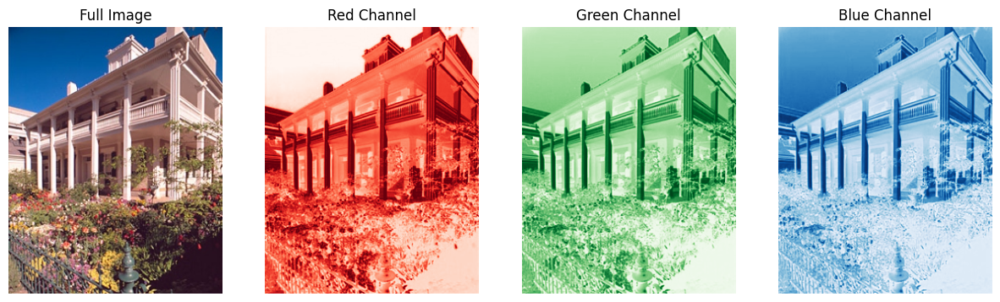

Figure 2: Opponent visualization


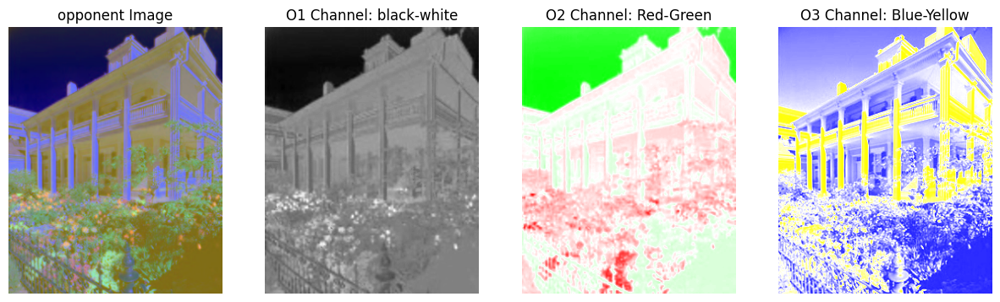

Figure 3: Normalized RGB visualization


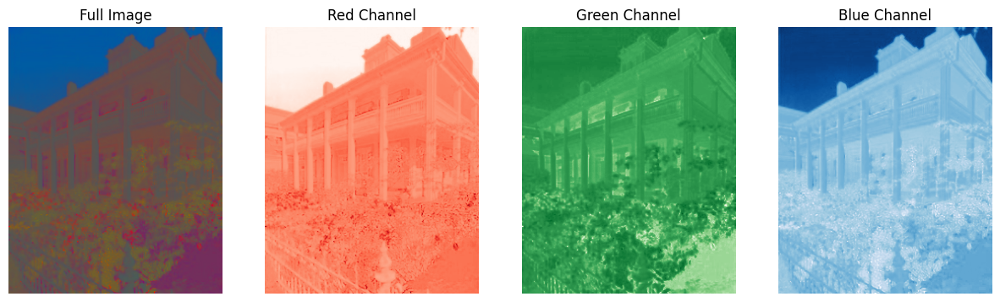

Figure 4: HSV visualization


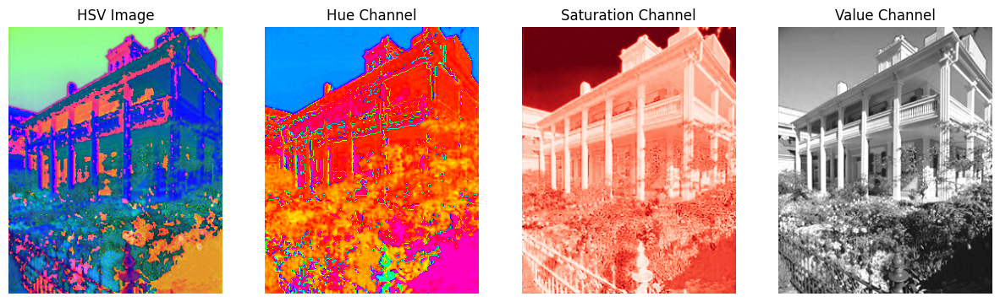

Figure 5: YCbCr visualization


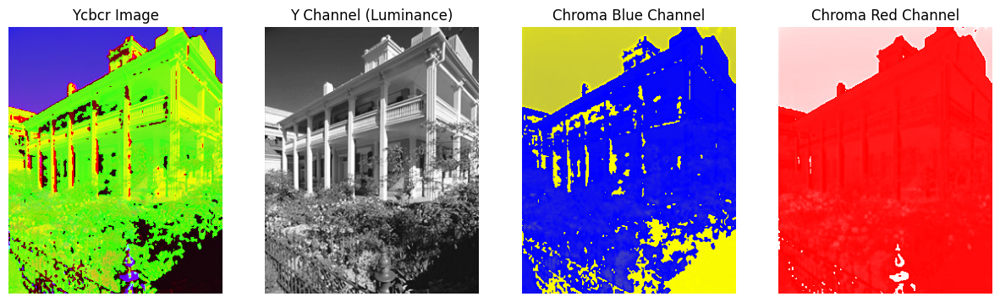

Figure 6: Grays visualization


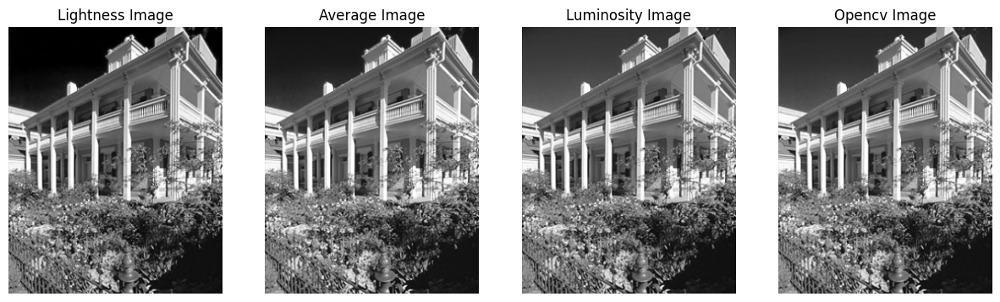

In [94]:
# Load and convert the image to RGB
image = cv2.imread('images/beehive_house.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


# YOUR CODE HERE
# Visualize all the colour spaces
print("Figure 1: RGB visualization")
visualize_colourspace(image, 'rgb')
print("Figure 2: Opponent visualization")
visualize_colourspace(convert_colour_space(image, 'opponent'), 'opponent')
print("Figure 3: Normalized RGB visualization")
visualize_colourspace(convert_colour_space(image, 'nrgb'), 'nrgb')
print("Figure 4: HSV visualization")
visualize_colourspace(convert_colour_space(image, 'hsv'), 'hsv')
print("Figure 5: YCbCr visualization")
visualize_colourspace(convert_colour_space(image, 'ycbcr'), 'ycbcr')
print("Figure 6: Grays visualization")
visualize_colourspace(convert_colour_space(image, 'grays'), 'grays')


<a id="question-4"></a>
#### <font color='#FF0000'>Question 4 (2 points)</font>

Explain each of the above 5 colour spaces and their properties. What are the benefits of using a different colour space other than RGB? Provide reasons for each of the above cases. You can include your observations from the visualizations.

##### <font color='yellow'>Answer:</font>

### opponent:

opponent color space is based in the theory of complementary colors. These colors are never perceived as a mixture but are always cancelling each other out. The three channels therefore are 'black vs white', 'green vs red' and 'yellow vs blue'. It could be usefull since RGB actually has quite some overlap in the perception of our cones, so it's possibly more useful using the difference between these channels, which is opponent. Color blind people also benefit from this color space.

### normalized Red Green Blue

normalized rgb is a simple normalization over the channels. It is used in cases of object detection where lighting influences the picture. if you normalize the channels first it becomes easier to distinquish complex objects, which you could have missed due to light or shading effects.

### Hue Saturation and Value

is a cylindrical coordinate representation of color, where The angle of the vertical axis signifies hue, the distance of the axis the saturation and the distance along the acces the lightness.

Figure 7: HSV color space\
![HSV Picture](hsv_picture.png)

This color space is an evolution on the rgb color space, which although correct, can be unintuitive for some use cases. Especially mixtures of all 3 colors can result in odd nonlinear relations. That is why HSV was created to be more productive for human use cases

### YCbCr

this color space contains the channels Y, meaning Luma, and Cb and Cr which are chroma blue and chroma red. They are formed from a coordinate transformation of the RGB space. It was introduced for transmission of TV color signals since it's more data efficient. Humans are more sensitive to intensity of color than the color, so you could use higher bandwith for the intensity while transmitting the color in a lower bandwith. Nowadays you can also use it for histogram equalization techniques, which don't work cleanly in RGB, but are appliceable in this color space.

### Grayscale

Grayscale is a color space where all colors are transformed with a certain technique into a black-white range image. This is mostly useful when the colors are irrelevant for the application, and you just need the contrast or shapes. 

The method that opencv uses for their grayscaling is a weighted average with 0.299 for red, 0.587 for green and 0.114 for bleu.

<a id="question-5"></a>
#### <font color='#FF0000'>Question 5 (1 point)</font>

Find one more colour space from the literature, briefly explain its properties and give a use case.

##### <font color='yellow'>Answer:</font>

### CMYK (process color)

Cyan, magenta, yellow, and key (black) is a color space build up in an opposite way from RGB, In RGB the combination of all colors results in white, while in CMYK it results in black. 

CMYK is often used in printing, where if you use tiny dots of the colors in a small enough pattern, it is perceived for humans to be a solid color.That is why black is added as a color in this scheme, even though you could construct it with the other 3, in printing it's easier if this color is added on itself too, in order to have more consistency for the printing of text, which is done with black.

<a id="section-2"></a>
### **Section 2: Colour Constancy**

Colour constancy is the ability to perceive the colors of objects consistently, regardless of the color of the light source. The goal of color constancy algorithms is to estimate the light source's illuminant and then correct the image so that it appears as if taken under a canonical (white) light source. In digital cameras, the automatic white balance (AWB) function performs this task to ensure images look natural.

In this part of the assignment, you will implement the well-known Grey-World Algorithm, a fundamental color constancy algorithm. This algorithm operates under the assumption that, under white light, the average color in a scene should be grey ([128, 128, 128]).

For more information, refer to the [Grey World algorithm on Wikipedia.](https://en.wikipedia.org/wiki/Color_normalization#Grey_world)

<a id="question-6"></a>
#### <font color='#FF0000'>Question 6 (8 points)</font>

Complete the function `apply_grey_world_algorithm` to apply color correction to an RGB image using the Grey-World algorithm.

Display the original image and the color-corrected one on the same figure. Use the `beehive_house.jpg` image to test your algorithm. You should see that the reddish color cast on the image is removed, making it look more natural.

***Note:*** You do not need to apply any pre or post-processing steps. For the calculation or processing, you are not allowed to use any available code or any dedicated library function except *standard Numpy functions*.

In [11]:
def apply_grey_world_algorithm(awb_img):
    """
    Apply the Grey-World algorithm to correct the color balance of an RGB image.

    This function assumes that under a white light source, the average color in a scene should be grey.
    It corrects the image by scaling each channel so that the mean of each channel is equal.

    Args:
        awb_img: RGB image to be color corrected

    Returns:
        gw_img: Color corrected image using the Grey-World algorithm
    """

    # YOUR CODE HERE 
    awb_img = awb_img.astype(np.float32)
    
    R, G, B = extract_channels(awb_img)
    mean_R = np.mean(R)
    mean_G = np.mean(G)
    mean_B = np.mean(B)
    new_R = R * 128 /mean_R #128 is the assumed average value of the image.
    new_G = G *128 /mean_G
    new_B = B * 128 /mean_B
    gw_img = np.stack([new_R, new_G, new_B], axis=-1)

    gw_img = gw_img * 255.0 / np.max(gw_img)
    gw_img = gw_img.astype(np.uint8)
    return gw_img 

Figure 8: The difference between the original and grey world image


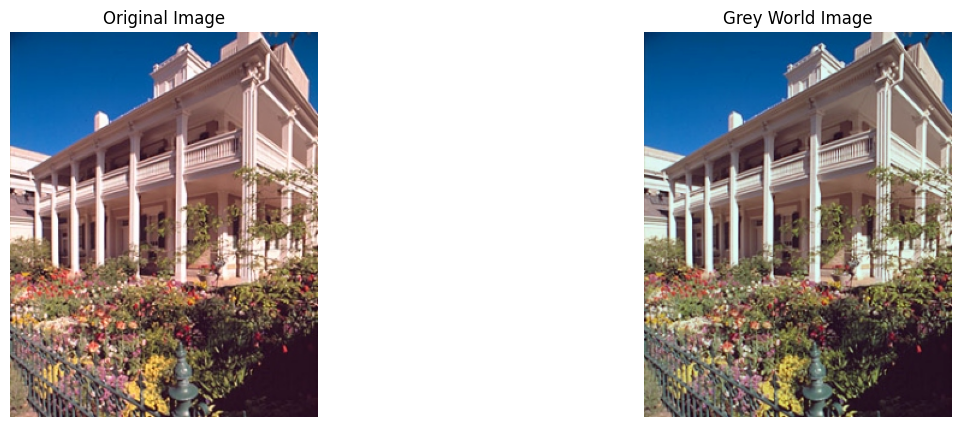

In [12]:
# load and convert the image to rgb
image = cv2.imread('images/beehive_house.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# YOUR CODE HERE
# apply the grey world algorithm
gw_image = apply_grey_world_algorithm(image)

#visualize the results
print("Figure 8: The difference between the original and grey world image")
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].imshow(image)
ax[0].set_title('Original Image')
ax[1].imshow(gw_image)
ax[1].set_title('Grey World Image')
for a in ax:
    a.axis('off')

<a id="question-7"></a>
#### <font color='#FF0000'>Question 7 (2 points)</font>

Give an example case for Grey-World Algorithm on where it might fail. Include your reasoning.

##### <font color='yellow'>Answer:</font>

The Grey-world algorithm does the assumption that the 'average' of a picture is grey. Therefore it fails when this assumption is not met, in cases where the average is actually leaning towards a color. It will discolor the entire image. This could also be caused by excessive shading or lighting in certain areas that change the colors strongly, leading to a different balance too.

<a id="question-8"></a>
#### <font color='#FF0000'>Question 8 (3 points)</font>

Find out one more colour constancy algorithm from the literature and explain it briefly.

##### <font color='yellow'>Answer:</font>

The white patch Algorithm is an algorithm that aims to correct outliers in the color channels. It assumes the brightest colors in an image are actually white, and changes it to reflect that. This is a simple algorithm that works nicely in controlled spaces, or in very bright areas, but has a harder time correcting when there are multiple sources of light (it leads to unnatural whitening effects). Similarly to the Gray-world algorithm, if the assumption is not met the method does not work properly.

<a id="section-3"></a>
### **Section 3: Intrinsic Image Decomposition**

Intrinsic image decomposition is the process of separating an image into its formation components, such as reflectance (albedo) and shading (illumination). <a name="cite_ref-1"></a>[<sup>[1]</sup>](#cite_note-1) Then, under the assumptions of body (diffuse) reflection, linear sensor response and narrow band filters, the decomposition of the observed image $I(\vec{x})$ at position $\vec{x}$ can be approximated as the element-wise product of its albedo $R(\vec{x})$ and shading $S(\vec{x})$ intrinsics:

$$I(\vec{x})=R(\vec{x}) \times S(\vec{x})$$

In this part of the assignment, you will experiment with intrinsic image components to perform a particular computational photography application: material recolouring. For the experiments, we will use images from a synthetic intrinsic image dataset. <a name="cite_ref-2"></a>[<sup>[2]</sup>](#cite_note-2)

<a name="cite_note-1"></a><small>[1.](#cite_ref-1) H. G. Barrow and J. M. Tenenbaum. Recovering intrinsic scene characteristics from images. Computer Vision Systems, pages 3-26, 1978.</small>

<a name="cite_note-2"></a><small>[2.](#cite_ref-1) http://www.cic.uab.cat/Datasets/synthetic_intrinsic_image_dataset/


<a id="question-9"></a>
#### <font color='#FF0000'>Question 9 (2 points)</font>

In what other components can an image be decomposed other than albedo and shading? Give an example and explain the concepts in your answer.

##### <font color='yellow'>Answer:</font>

You could also divide an image up into an illumination, reflectance, and specular component <a name="cite_ref-1"></a>[<sup>[1]</sup>](#cite_note-1). In this method of decomposition, the illumination component takes care of the shading effects, shadows and interreflections. The reflectance/albedo represents the manner of which light reflects independent of angle and from illumination. The specular components includes the highlights that are actually caused due to the angle and illumination.

Figure 9:
![Example Image Decomposition](example_image_decomp.png)<a name="cite_ref-1"></a>[<sup>[1]</sup>]

<a name="cite_note-1"></a><small>[1.](#cite_ref-1)
Grosse, R., Johnson, M. K., Adelson, E. H., & Freeman, W. T. (2009, September). Ground truth dataset and baseline evaluations for intrinsic image algorithms. In 2009 IEEE 12th International Conference on Computer Vision (pp. 2335-2342). IEEE.</small>

<a id="question-10"></a>
#### <font color='#FF0000'>Question 10 (2 points)</font>

If you check the literature, you will see that almost all intrinsic image decomposition datasets are composed of synthetic images. What might be the reason for that?

##### <font color='yellow'>Answer:</font>

In order to create real life datasets for image decomposition, it would be required to know the ground truth. The ground truth in these cases is very difficult to garner, as every bit of light and/or movement of the objects changes the outcome of the albedo and the shading. That is why it is easier to generate it artificially. Then the exact ground truth is known, which is easier for experimenters (this has however reduced generalizability of trained models to real life situations)

<a id="question-11"></a>
#### <font color='#FF0000'>Question 11 (4 points)</font>

Choose an object with a single color from the `/intrinsic_images/` folder, which is based on the [synthetic intrinsic image dataset](http://www.cic.uab.cat/Datasets/synthetic_intrinsic_image_dataset/).

Demonstrate that you can reconstruct the original PNG image from its intrinsics using the albedo and shading. Your script should output a figure displaying the original image, its intrinsic images, and the reconstructed one. Complete the function `reconstruct_image_from_intrinsics()`.


In [13]:
def reconstruct_image_from_intrinsics(albedo_img, shading_img):
    """
    Reconstruct the original image from its intrinsic images (albedo and shading).

    This function takes the albedo and shading images as input, 
    and reconstructs the original image by multiplying albedo with shading.

    Args:
        albedo_img: Image representing the albedo (reflectance)
        shading_img: Image representing the shading

    Returns:
        iid_img: Reconstructed image
    """

    # YOUR CODE HERE
    albedo_img = albedo_img.astype(np.float32)
    print(shading_img[135, 150])
    shading_img = shading_img.astype(np.float32)
    iid_img = albedo_img * shading_img
    #normalize
    iid_img = iid_img * 255.0  / np.max(iid_img) 
    iid_img = iid_img.astype(np.uint8)
    return iid_img

object shape: (270, 480, 3)
object albedo shape: (270, 480, 3)
object shading shape: (270, 480, 3)
[ 65  80 109]
Figure 10: Reconstruction of the image from intrinsics


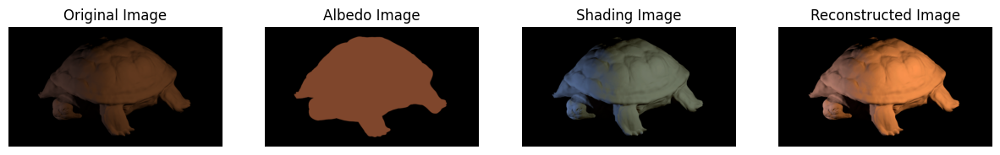

In [14]:
# Replace the object name with a valid name from the dataset
img_path = './intrinsic_images/'
object_name = 'turt_ml1'

# Read with opencv
obj = cv2.imread(img_path + object_name + '.png')
obj = cv2.cvtColor(obj, cv2.COLOR_BGR2RGB)
  # Convert BGR to RGB
if obj is None:
    raise FileNotFoundError(f'No image found with filename: {img_path + object_name + ".png"}')
else:
    print(f'object shape: {obj.shape}')

obj_sha = cv2.imread(img_path + object_name + '_shad.png')
obj_sha = cv2.cvtColor(obj_sha, cv2.COLOR_BGR2RGB)

if obj_sha is None:
    raise FileNotFoundError(f'No image found with filename: {img_path + object_name + "_shad.png"}')
else:
    print(f'object albedo shape: {obj_sha.shape}')

obj_alb = cv2.imread(img_path + object_name.split('_')[0] + '_refl.png')
obj_alb = cv2.cvtColor(obj_alb, cv2.COLOR_BGR2RGB)
if obj_alb is None:
    raise FileNotFoundError(f'No image found with filename: {img_path + object_name.split("_")[0] + "_refl.png"}')
else:
    print(f'object shading shape: {obj_alb.shape}')

# YOUR CODE HERE

# Reconstruct the original image
reconstructed_img = reconstruct_image_from_intrinsics(obj_alb, obj_sha)
#plot the results
print("Figure 10: Reconstruction of the image from intrinsics")
fig, ax = plt.subplots(1, 4, figsize=(15, 5))
ax[0].imshow(obj)
ax[0].set_title('Original Image')

ax[1].imshow(obj_alb)
ax[1].set_title('Albedo Image')

ax[2].imshow(obj_sha)
ax[2].set_title('Shading Image')

ax[3].imshow(reconstructed_img)
ax[3].set_title('Reconstructed Image')
for a in ax:
    a.axis('off')

<a id="question-12"></a>
#### <font color='#FF0000'>Question 12 (2 points)</font>

Manipulating colors in photographs is an important problem with many applications in computer vision. Recoloring algorithms aim to manipulate colors effectively, and better results can be obtained if the albedo image is available as it is independent of confounding illumination effects.

First determine the true material color of the object you picked in RGB space (uniform color in this case). 

- Complete the code for the function `get_true_color()`.
- Plot the true color of the object in RGB space, make sure to also plot each channel separately. 

**Hint:** You can use `np.tile` to create a visualization of the true color.

In [15]:
def get_true_color(albedo_img):
    """
    Determines the true material color of the object in the albedo image.

    This function calculates the average RGB color in the albedo image, which represents the true material color of the object.

    Args:
        albedo_img: Albedo (reflectance) image

    Returns:
        true_colour: True material color of the object in RGB space
    """

    # YOUR CODE HERE

    #create a 1 dimensional mask layer for all black values
    mask = np.any(albedo_img != [0, 0, 0], axis=-1)

    R, G, B = extract_channels(albedo_img)
    true_colour = []
    for color in [R, G, B]:
        color = color[mask]
        np.mean(color)
        true_colour.append(np.mean(color))
    
    true_colour = np.round(true_colour).astype(np.uint8)
    return true_colour

True color of the object: [125  69  43]
Figure 11: True color of the objects albedo image


Text(0.5, 1.0, 'Blue Channel')

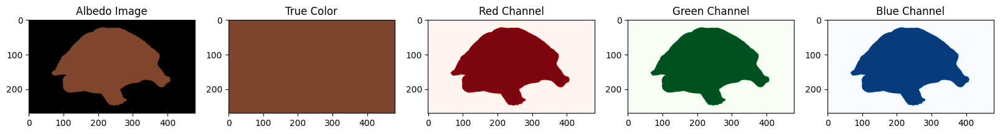

In [16]:
# get the true color of the object's albedo image
true_color = get_true_color(obj_alb)
print(f'True color of the object: {true_color}')

print("Figure 11: True color of the objects albedo image")
fig, ax = plt.subplots(1, 5, figsize=(20, 5))
ax[0].imshow(obj_alb)
ax[0].set_title('Albedo Image')
ax[1].imshow(np.tile(true_color, obj_alb.shape[:2] + (1,)))
ax[1].set_title('True Color')

#separate colors
R, G, B = extract_channels(obj_alb)
ax[2].imshow(R, cmap='Reds')
ax[2].set_title('Red Channel')

ax[3].imshow(G, cmap='Greens')
ax[3].set_title('Green Channel')

ax[4].imshow(B, cmap='Blues')
ax[4].set_title('Blue Channel')


# YOUR CODE HERE

<a id="question-13"></a>
#### <font color='#FF0000'>Question 13 (2 points)</font>

Assume you are given the PNG image and have access to its intrinsic albedo and shading images.

Recolor the object's image with pure red (255, 0, 0). Complete the code for the function `recolor_image()`. Display the recolored version of the object. Make sure to also plot each channel separately.

In [17]:
def recolor_image(albedo_img, shading_img):
    """
    Recolors an image based on its albedo and shading images.

    This function recolors the input albedo image by changing non-black pixels to red
    and then reconstructs the final image using the provided shading image.

    Args:
        albedo_img: Albedo (reflectance) image
        shading_img: Shading image

    Returns:
        recolored_img: Recolored and reconstructed image
    """

    # YOUR CODE HERE
    mask = np.any(albedo_img != [0, 0, 0], axis=-1)
    
    R, G, B = extract_channels(albedo_img)
    R[mask == True] = 255
    G[mask == True] = 0
    B[mask == True] = 0
    
    albedo_img = np.stack([R, G, B], axis=-1)
    recolored_img = reconstruct_image_from_intrinsics(albedo_img, shading_img)

    return recolored_img

[ 65  80 109]
(270, 480, 3)
[ 65  80 109]
Figure 12: Recoloring the image


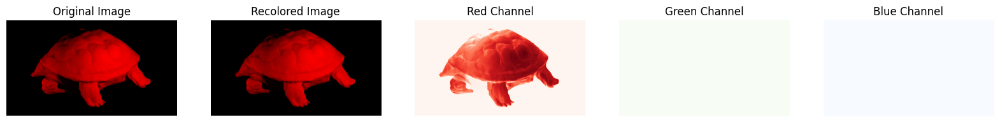

In [18]:
recolored_image = recolor_image(obj_alb, obj_sha)
print(recolored_image.shape)
original_image = reconstruct_image_from_intrinsics(obj_alb, obj_sha)
print("Figure 12: Recoloring the image")
fig, ax = plt.subplots(1, 5, figsize=(20, 5))
ax[0].imshow(original_image)
ax[0].set_title('Original Image')
ax[1].imshow(recolored_image)
ax[1].set_title('Recolored Image')
ax[2].imshow(recolored_image[:, :, 0], cmap='Reds')
ax[2].set_title('Red Channel')
ax[3].imshow(recolored_image[:, :, 1], cmap='Greens')
ax[3].set_title('Green Channel')
ax[4].imshow(recolored_image[:, :, 2], cmap='Blues')
ax[4].set_title('Blue Channel')

for a in ax:
    a.axis('off')



# YOUR CODE HERE

<a id="question-14"></a>
#### <font color='#FF0000'>Question 14 (2 points)</font>

Although you have recoloured the object with pure red, the reconstructed images do not seem to display those pure colors and thus the colour distributions over the object do not appear uniform. Explain the reason.

##### <font color='yellow'>Answer:</font>


Even though it is colored with pure red, the image is still reconstructed with shading, which has an interaction effect with the red. This is the reason it turns out to be a slightly differently colored configuration in the reconstructed image.

__Note:__  This was a simple case where the image is synthetic, object centered and has only one colour, and you have access to its ground-truth intrinsic images. Real world scenarios require more than just replacing a single colour with another, not to mention the complexity of achieving a decent intrinsic image decomposition.

<a id="section-4"></a>
### **Section 4: Photometric Stereo**

In this section, we delve into the photometric stereo technique, a method used to reconstruct a surface's shape from a set of images captured under varying lighting conditions. This approach is based on the principles outlined in Section 5.4 of Forsyth and Ponce's *Computer Vision: A Modern Approach*, which provides a comprehensive introduction to the theory and application of photometric stereo in computer vision.

Photometric stereo is particularly useful for capturing fine details of surface geometry. The core idea is to utilize an orthographic camera to take multiple images of a surface, each under different lighting conditions. By analyzing the variations in image intensity across these images, we can infer the surface normals and, subsequently, reconstruct the surface's height at each pixel, leading to what is commonly known as a height map or depth map.

The method assumes that the camera and the surface remain stationary, with illumination coming from different directions. By capturing enough images with different light source vectors, we can solve for the surface normals and albedo at each pixel.

<a id="question-15"></a>
#### <font color='#FF0000'>Question 15 (4 points)</font>

Start with the grayscale sphere model located in the SphereGray5 folder. The folder contains 5 images of a sphere with a grayscale checker texture under different lighting conditions. Your task is to estimate the surface reflectance (albedo) and surface normal of this model.

In this question, you will need to complete the function `estimate_albedo_and_normals()` to estimate the albedo and surface normal map for the SphereGray5 folder.

To assist you, two helper functions are provided:

- `load_synthetic_images()`: This function loads the synthetic images from the specified directory.
- `show_results()`: This function displays the albedo, surface normals, and optionally the height map and surface error.

These helper functions are provided to simplify the process of loading images and displaying your results.

**Hint**: To get the least-squares solution of a linear system, you can use the `numpy.linalg.lstsq` function.

Make sure to include images of your results in your notebook at key points. When visualizing 3D models, choose viewpoints that clearly illustrate the structure, and feel free to use multiple viewpoints if necessary.

In [4]:
def load_synthetic_images(image_dir='./photometrics_images/SphereGray5/', channel=0):
    """
    Loads synthetic images and their corresponding light source directions.

    This function reads all images from the specified directory, extracts the relevant channel, and stacks the images along the third dimension. It also extracts the light source directions from the image filenames and normalizes both the image stack and the light source vectors.

    Args:
        image_dir: directory containing the synthetic images
        channel: color channel to be extracted (default is 0, corresponding to the red channel)

    Returns:
        image_stack: a 3d numpy array of stacked images
        normalized_light_dirs: a 2d numpy array of normalized light source directions
    """
    # list all files in the image directory
    image_files = os.listdir(image_dir)
    num_images = len(image_files)

    image_stack = None
    light_directions = None
    
    # assumed z component for the light direction
    z_component = 0.5  

    # loop through all image files
    for i in range(num_images):
        # read the input image
        image = cv2.imread(os.path.join(image_dir, image_files[i]))
        image = np.flip(image, axis=-1)  # flip the image to correct the channel order
        image = image[:, :, channel]  # extract the specified color channel

        # initialize image stack and light direction array on the first iteration
        if image_stack is None:
            height, width = image.shape
            print('image size (h*w): %d*%d' % (height, width))
            image_stack = np.zeros([height, width, num_images], dtype=int)
            light_directions = np.zeros([num_images, 3], dtype=np.float64)

        # stack the image along the third dimension
        image_stack[:, :, i] = image

        # extract light direction from the image filename
        x_component = np.double(image_files[i][(image_files[i].find('_') + 1):image_files[i].rfind('_')])
        y_component = np.double(image_files[i][image_files[i].rfind('_') + 1:image_files[i].rfind('.png')])
        light_directions[i, :] = [x_component, -y_component, z_component]

    # convert the image stack to double precision for further processing
    image_stack = np.double(image_stack)

    # normalize the image stack
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)

    # handle the case where all pixel values are the same
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)  

    # normalize the light direction vectors
    norm_factors = np.tile(np.sqrt(np.sum(light_directions ** 2, axis=1, keepdims=True)), (1, light_directions.shape[1]))
    normalized_light_dirs = light_directions / norm_factors

    return image_stack, normalized_light_dirs

In [5]:
def show_results(albedo, normals, height_map=None, SE=None):
    """
    Displays the albedo, normals, and optionally the height map and surface error (SE).

    Args:
        albedo: albedo (reflectance) map
        normals: surface normal map
        height_map: reconstructed height map (optional)
        SE: surface error map (optional)
    """
    # stride in the plot, you may want to adjust it to different images
    stride = 1

    if albedo is not None:
        # showing albedo map
        fig = plt.figure(figsize=(5, 5))
        albedo_max = 1  # normalize albedo values
        albedo = albedo / albedo_max
        print("Albedo shape:", albedo.shape)
        plt.imshow(albedo, cmap="gray")
        plt.title('Albedo Map', fontsize=16)
        plt.show()

    # showing normals as three separate channels
    figure = plt.figure(figsize=(10, 10))
    ax1 = figure.add_subplot(221)
    ax1.imshow(normals[..., 0], vmin=-1, vmax=1, cmap='viridis')
    ax1.set_axis_off()
    ax1.set_title('Normal Channel x', fontsize=16)
    ax2 = figure.add_subplot(222)
    ax2.imshow(normals[..., 1], vmin=-1, vmax=1, cmap='viridis')
    ax2.set_axis_off()
    ax2.set_title('Normal Channel y', fontsize=16)
    ax3 = figure.add_subplot(223)
    ax3.imshow(normals[..., 2], vmin=-1, vmax=1, cmap='viridis')
    ax3.set_axis_off()
    ax3.set_title('Normal Channel z', fontsize=16)
    ax4 = figure.add_subplot(224)
    ax4.imshow((normals + 1) * 0.5)
    ax4.set_axis_off()
    ax4.set_title('Combined Normals', fontsize=16)
    plt.show()

    # Create meshgrid for plotting 3D surfaces
    X, Y, _ = np.meshgrid(np.arange(0, np.shape(normals)[0], stride),
                          np.arange(0, np.shape(normals)[1], stride),
                          np.arange(1))
    X = X[..., 0]
    Y = Y[..., 0]

    # Show both heightmap and SE in a 1x2 subplot if they're available
    if height_map is not None and SE is not None:
        fig = plt.figure(figsize=(8, 4))

        # Show heightmap
        ax1 = fig.add_subplot(1, 2, 1, projection='3d')
        H_height_map = height_map[::stride, ::stride]
        ax1.plot_surface(X, Y, H_height_map.T)
        ax1.set_title("Height Map")
        ax1.set_xlabel("x")
        ax1.set_ylabel("y")

        # Show SE
        ax2 = fig.add_subplot(1, 2, 2, projection='3d')
        H_SE = SE[::stride, ::stride]
        ax2.plot_surface(X, Y, H_SE.T, color='r')
        ax2.set_title("SE")
        ax2.set_xlabel("x")
        ax2.set_ylabel("y")

        plt.tight_layout()
        plt.show()

    # Only show heightmap if it's available
    elif height_map is not None:
        fig = plt.figure()
        ax = fig.add_subplot(projection='3d')
        H_height_map = height_map[::stride, ::stride]
        ax.plot_surface(X, Y, H_height_map.T)
        ax.set_title("Height Map")
        ax.set_xlabel("x")
        ax.set_ylabel("y")
        plt.show()

    # Only show SE if it's available
    elif SE is not None:
        fig = plt.figure()
        ax = fig.add_subplot(projection='3d')
        H_SE = SE[::stride, ::stride]
        ax.plot_surface(X, Y, H_SE.T, color='r')
        ax.set_title("SE")
        ax.set_xlabel("x")
        ax.set_ylabel("y")
        plt.show()

Following the guidelines in *Computer Vision: A Modern Approach* by Forsyth and Ponce, Chapter 5, Section 5.4, you will complete the `estimate_albedo_and_normals()` function by implementing the following steps:

1. **Iterate through each point in the image array**:
   - For each pixel, extract the intensity values across all images and stack them into a vector `i`.

2. **Construct the diagonal matrix**:
   - Construct the diagonal matrix `scriptI` using the vector `i`.

3. **Solve the linear system**:
   - Solve the equation `scriptI * scriptV * g = scriptI * i` to obtain the vector `g` for each pixel.

4. **Compute the albedo**:
   - The albedo at each pixel is the magnitude (norm) of the vector `g`, denoted as `|g|`.

5. **Compute the surface normal**:
   - The surface normal at each pixel is given by `g / |g|`, where `|g|` is non-zero.

In [6]:
def estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=True):
    """
    Estimates the surface albedo and normals from a stack of images.

    This function computes the albedo and surface normals for each pixel in the 
    image stack using the provided light source directions. Optionally, it applies 
    the shadow trick to improve the robustness of the solution.

    Args:
        image_stack: The stack of images of the surface, stacked along the third dimension.
        scriptV: The matrix containing the source and camera information.
        shadow_trick: Boolean indicating whether to use the shadow trick (default is True).

    Returns:
        albedo: The estimated surface albedo.
        normal: The estimated surface normals.
    """

    h, w, _ = image_stack.shape

    # create arrays for the albedo and normals
    albedo = np.zeros([h, w])
    normal = np.zeros([h, w, 3])

    for i in range(h):
        for j in range(w):
            vector_i = image_stack[i,j]
            if shadow_trick:
                scriptI = np.diag(vector_i)
                g = np.linalg.lstsq(scriptI @ scriptV, scriptI @ vector_i)[0]
            else:
                g = np.linalg.lstsq(scriptV,vector_i)[0]
            albedo_ij = np.linalg.norm(g)
            albedo[i,j] = albedo_ij
            np.divide(g, albedo_ij, out=normal[i,j], where=albedo_ij!=0) #To not have divisions by zero

    return albedo, normal

image size (h*w): 512*512

Figure 13: Albedo and surface normals for SphereGray5 with the shadow trick applied
Albedo shape: (512, 512)


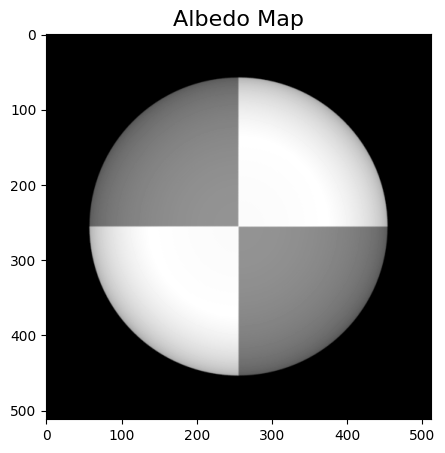

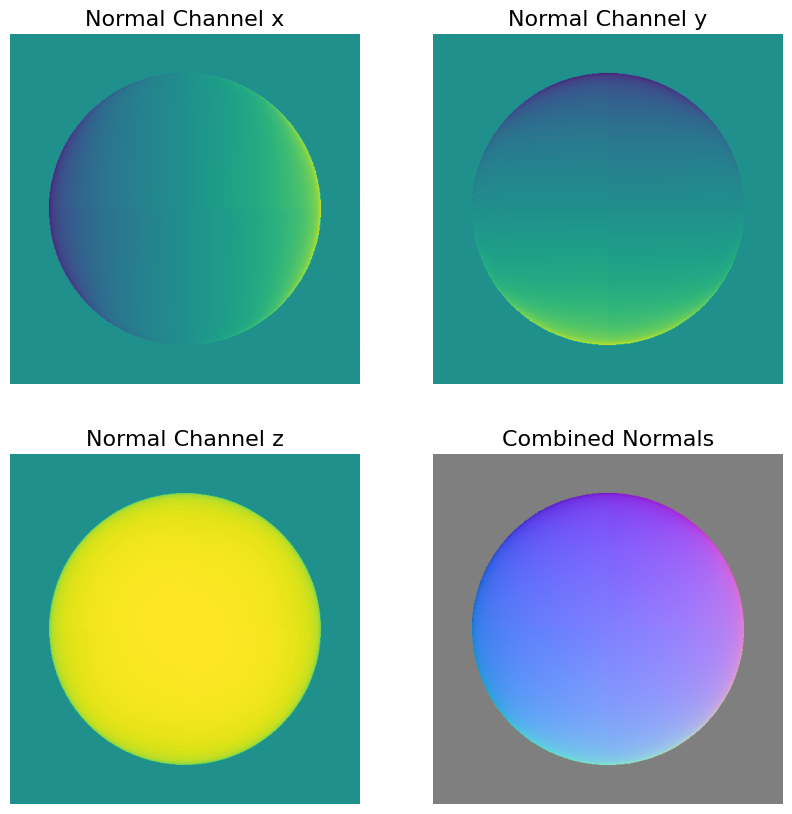

The max of the albedo values is: 1.03818001075028


In [7]:
# load synthetic images for SphereGray5
image_stack, normalized_light_dirs = load_synthetic_images(image_dir= './photometrics_images/SphereGray5')

# estimate albedo and normals
albedo_s5_trick,normals_s5_trick = estimate_albedo_and_normals(image_stack, normalized_light_dirs)

# show results
print("\nFigure 13: Albedo and surface normals for SphereGray5 with the shadow trick applied")
show_results(albedo_s5_trick,normals_s5_trick)
print(f"The max of the albedo values is: {np.max(albedo_s5_trick)}")

<a id="question-16"></a>
#### <font color='#FF0000'>Question 16 (2 points)</font>

After implementing the `estimate_albedo_and_normals()` function, what do you expect to see in the albedo image? How does this compare to your actual result? Explain the differences.

##### <font color='yellow'>Answer:</font>

We expect to see the albedo values for each point hitting a pixel. With the specific color patern on the ball we expect the darker parts to have a lower albedo than the lighter parts. At first glace at figure 13, this seems in fact to be the case. 

But these values should be from 0 to 1 as albedo is the fraction of light that gets reflected of a surface. When Inspecting the albedo image we find that this does not hold for the estimated albedos, the maximum albedo exceeds 1 (1.038...) which does not make it a fraction anymore.

<a id="question-17"></a>
#### <font color='#FF0000'>Question 17 (1 point)</font>

In principle, what is the minimum number of images you need to estimate the albedo and surface normal? Explain your reasoning.

##### <font color='yellow'>Answer:</font>

As the estimation is optained by solving a linear system for 3 outputs we would need atleast 3 images to be able to solve it. Less could also be used but will not give an accurate result. When there are exactly 3 images that have a non correlated light source vectors you could solve the system getting the inverse of the lightsource matrix. When there are more than 3 images minimizing the squared errors becomes usefull.

<a id="question-18"></a>
#### <font color='#FF0000'>Question 18 (2 points)</font>

Now, run the algorithm with more images by using the SphereGray25 folder. Observe the differences in the results when using more images. Report your findings. 

You could try all images at once or a few at a time, incrementally. Choose a strategy and justify it by discussing your results.

image size (h*w): 512*512
Figure 14: The results of the estimates for the SphereGray25 folder in increments of 5
--------------------------------------------
Results for 5 images:
Albedo shape: (512, 512)


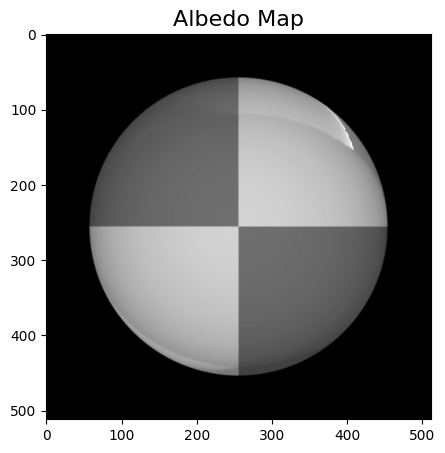

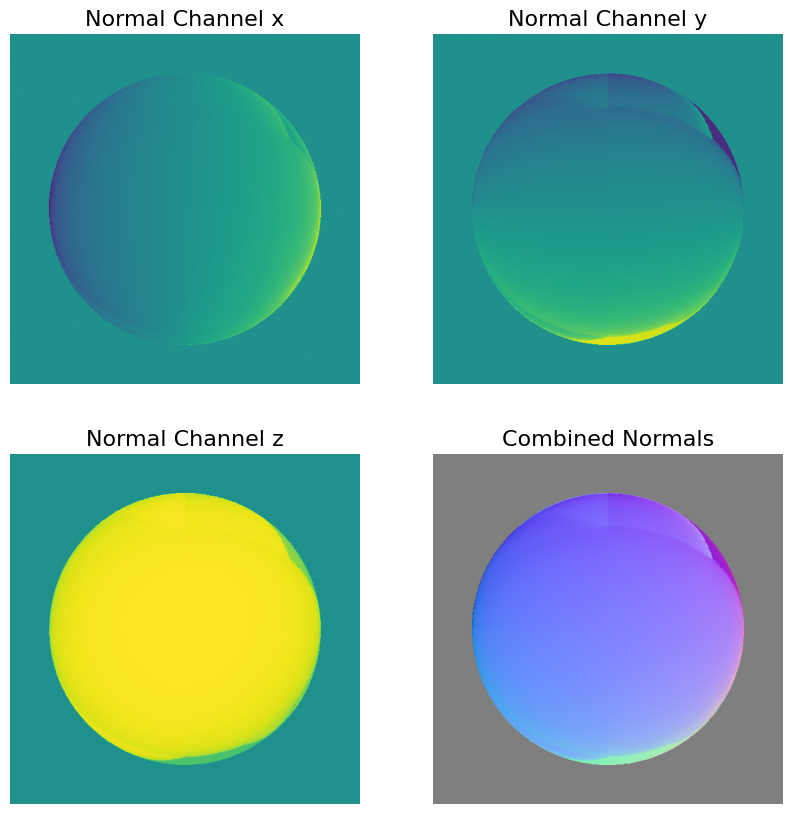

The max of the albedo values for 5 images is 1.5557165058098852
--------------------------------------------
Results for 10 images:
Albedo shape: (512, 512)


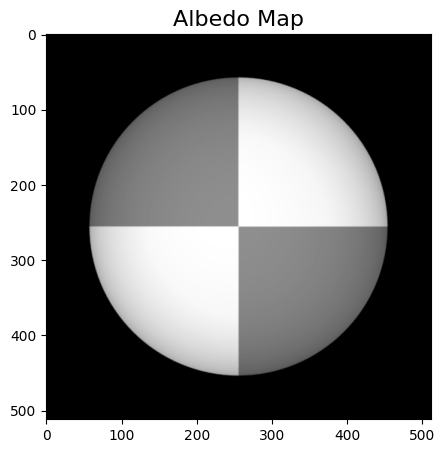

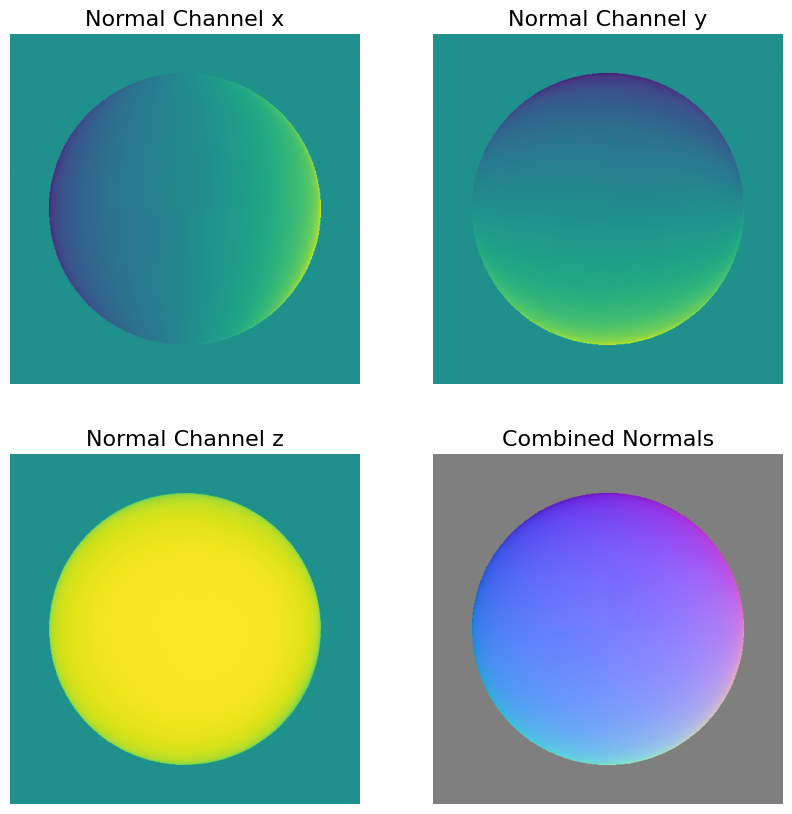

The max of the albedo values for 10 images is 1.1236330762368223
--------------------------------------------
Results for 15 images:
Albedo shape: (512, 512)


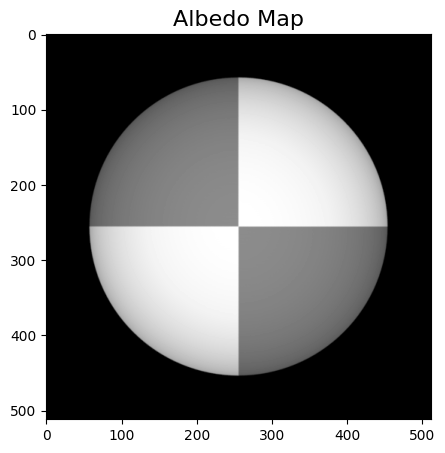

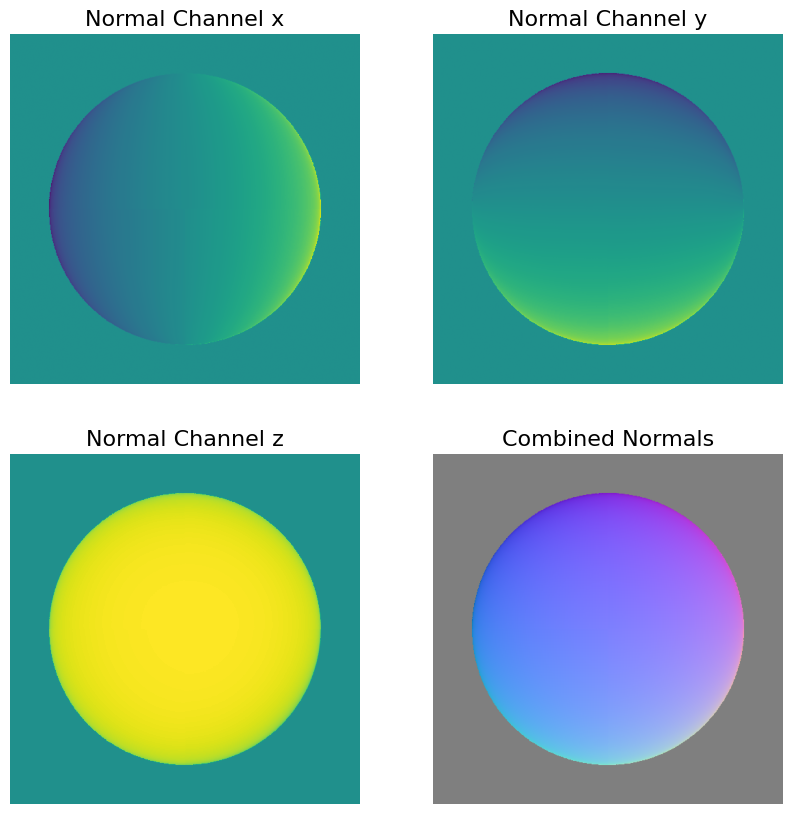

The max of the albedo values for 15 images is 1.1686221613604302
--------------------------------------------
Results for 20 images:
Albedo shape: (512, 512)


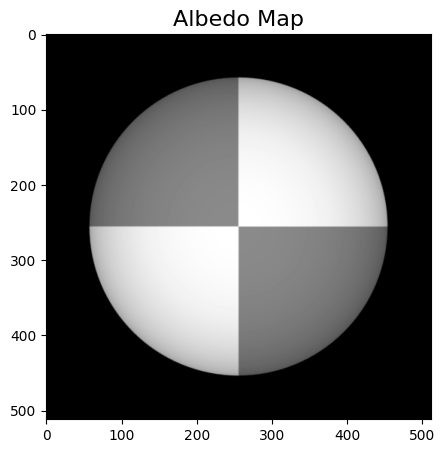

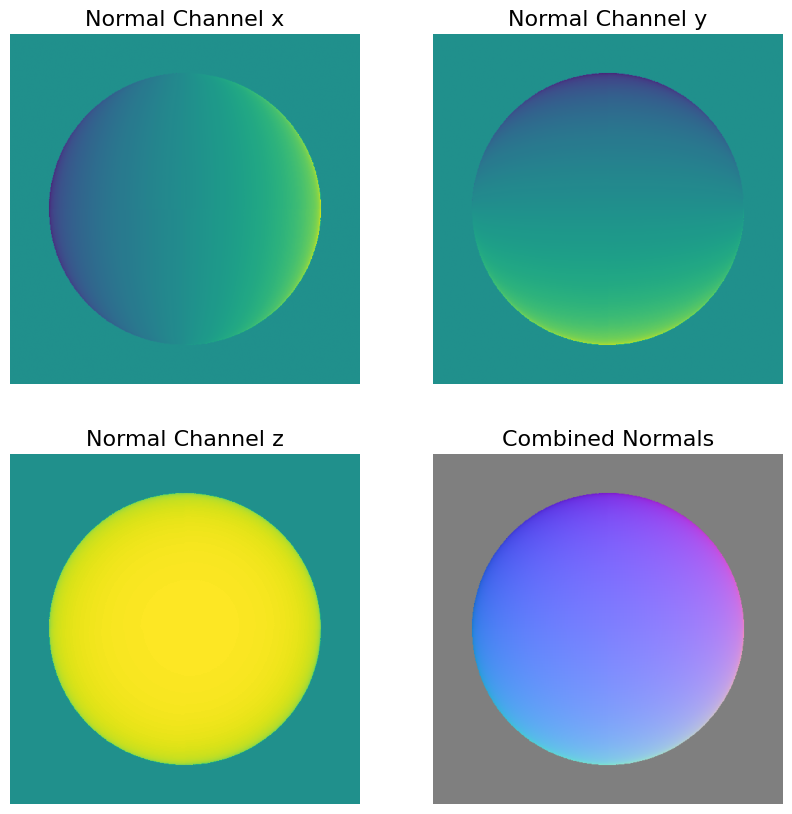

The max of the albedo values for 20 images is 1.1972260313648668
--------------------------------------------
Results for 25 images:
Albedo shape: (512, 512)


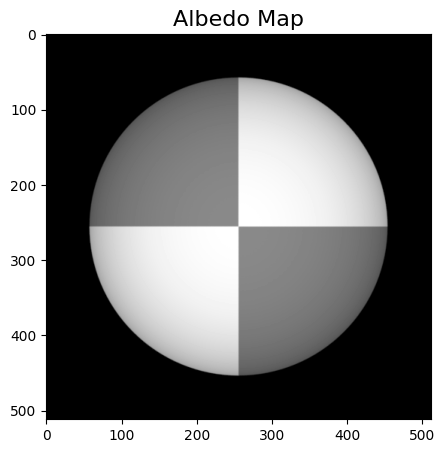

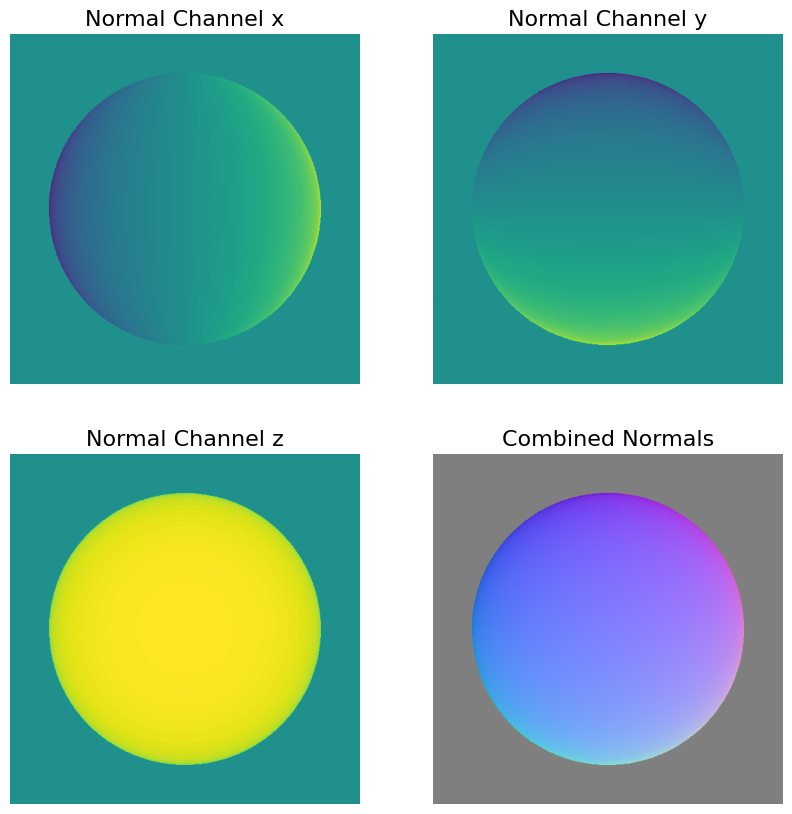

The max of the albedo values for 25 images is 1.2166823780219738
--------------------------------------------


In [8]:
# load synthetic images for SphereGray25
image_stack, normalized_light_dirs = load_synthetic_images('./photometrics_images/SphereGray25/')

# estimate albedo and normals for SphereGray25
print("Figure 14: The results of the estimates for the SphereGray25 folder in increments of 5")
for i in range(0,25, 5):
    print("--------------------------------------------")
    print(f"Results for {i+5} images:")
    albedo, normals = estimate_albedo_and_normals(image_stack[:,:,:i+5], normalized_light_dirs[:i+5,:])
    # show the results for SphereGray25
    show_results(albedo,normals)
    print(f"The max of the albedo values for {i+5} images is {np.max(albedo)}")
print("--------------------------------------------")
albedo_s25_trick, normals_s25_trick = estimate_albedo_and_normals(image_stack[:,:,:i+5], normalized_light_dirs[:i+5,:])


##### <font color='yellow'>Answer:</font>

By incrementing the number of images by 5 we observe that having more images does create a better surface normal. But most important are the variation in light directions of the images. This can be seem in the results above where up to 15 images the middle of the right side has a bite out of it. When looking at the images we see that up until then no images with a lightsource on the right have been seen. 

We see that up until 20 images the Surface normal for the x direction is influenced by the different colors of the sphere. This can be observed as seeing the pattern in the normal image.

We also see that the albedo max values after using 15 images are closer to 1. We do not see this value getting lower with the more images we use. According to the book at section 5.4 pixels with an albedo higher than 1 are either not working properly or the scriptV is incorrect. 

<a id="question-19"></a>
#### <font color='#FF0000'>Question 19 (2 points)</font>

Consider the impact of shadows in photometric stereo. Explain the trick mentioned in the textbook to deal with shadows.

Remove this trick from your implementation and check your results. Is the trick necessary when using 5 images? How about when using 25 images?

image size (h*w): 512*512
image size (h*w): 512*512
Figure 15: Albedo and normals for 5 images without the shadow trick:
Albedo shape: (512, 512)


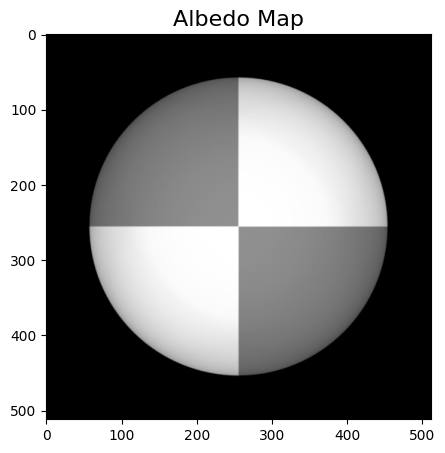

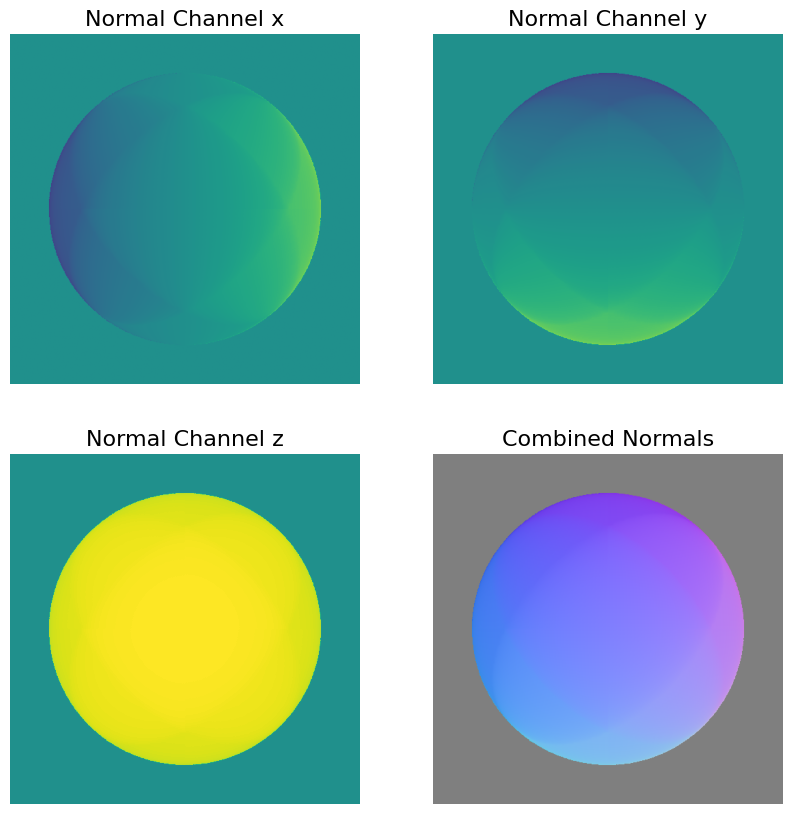

Figure 16: Albedo and normals for 25 images without the shadow trick:
Albedo shape: (512, 512)


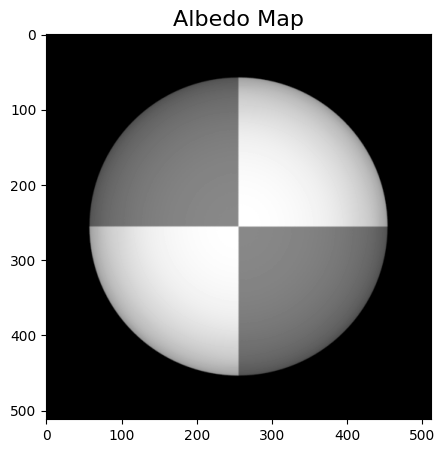

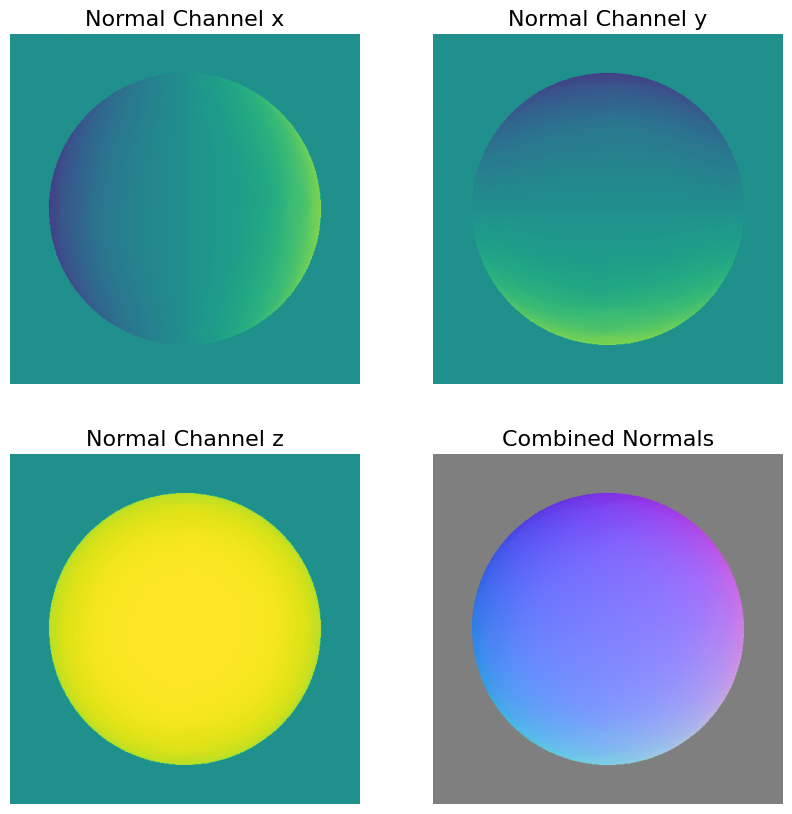

In [9]:
# load synthetic images for SphereGray5 and SphereGray25
image_stack_s5, normalized_light_dirs_s5 = load_synthetic_images('./photometrics_images/SphereGray5/')
image_stack_s25, normalized_light_dirs_s25 = load_synthetic_images('./photometrics_images/SphereGray25/')

# estimate albedo and normals without shadow trick
albedo_s5,normals_s5 = estimate_albedo_and_normals(image_stack_s5, normalized_light_dirs_s5, shadow_trick= False)
albedo_s25,normals_s25 = estimate_albedo_and_normals(image_stack_s25, normalized_light_dirs_s25, shadow_trick= False)

# show results without shadow trick
print("Figure 15: Albedo and normals for 5 images without the shadow trick:")
show_results(albedo_s5,normals_s5)
print("Figure 16: Albedo and normals for 25 images without the shadow trick:")
show_results(albedo_s25,normals_s25)

##### <font color='yellow'>Answer:</font>

- The impact of shadows in photometric stereo is that they contribute to the calculations of the gradients. 
This becomes a problem as we assumed the Intensity of pixel x,y = the dot product of the gradient (g) and the source vector times a constant (V). when the intensity for a pixel is 0 and the V is not all zeros according to our model we assume that g is either all zeros or g is orthogonal to V. Both of these cases are not true when the pixel corresponds to a point that is in the shadow. So a picture with a certain pixel in the shadow will contribute a faulty point for estimating g. and because least squares want to minimize a loss the estimated g gets pulled towards this faulty point.

- The trick in the book multiplies both sides of the equation with the intensity. This makes that V for a pixel where the intensity is 0 and thus the gradient can be anything because the dot product with a zero vector is always zero. In general this trick scales the inpact of an image for a pixel with respect to its intensity, making low intensity levels contribute less to solving g than high intensities.

- When comparing the surface normals of the sphere with 5 images (Figure 15) with the ones that use the shadow trick in Figure 13 we see that it makes a lot of difference. The shadows of each of the 5 images is clearly visible in the visualization of the surface normal. It is necessary to use this trick when recovering the surface normal based on these 5 images.

- When comparing the surface normals of the sphere with 25 images (Figure 16) with the ones that use the shadow trick in Figure 14(last visual) we do not notice a difference. This shows that the trick is not necessary with these 25 images. Having enough images where the pixel is not in the shadow could make up for the errors the shadow images create.

<a id="question-20"></a>
#### <font color='#FF0000'>Question 20 (5 points)</font>

Before reconstructing the surface height map, it is necessary to compute the partial derivatives, $\frac{\partial f}{\partial x}$ and $\frac{\partial f}{\partial y}$ (referred to as *p* and *q* in the algorithm). These partial derivatives also allow for a double-check of the computation through a test of *integrability*.

In this question, you will need to complete the function `check_integrability()` to compute the partial derivatives *p* and *q*.

Make sure to verify your results by examining the integrability of the computed derivatives.

In [10]:
def check_integrability(normals):
    """
    Checks the surface gradient for integrability.

    This function computes the partial derivatives of the surface function with respect to x and y 
    (p and q), and calculates the squared errors of the mixed partial derivatives to test for integrability.

    Args:
        normals: The normal map of the surface.

    Returns:
        p: The partial derivative of the surface function with respect to x (df/dx).
        q: The partial derivative of the surface function with respect to y (df/dy).
        SE: The squared errors of the mixed partial derivatives.
    """

    # initialize p, q, and SE
    p = np.zeros(normals.shape[:2])
    q = np.zeros(normals.shape[:2])
    SE = np.zeros(normals.shape[:2])

    np.divide(normals[:,:,0], normals[:,:,2], out = p, where=normals[:,:,2]!=0)
    np.divide(normals[:,:,1], normals[:,:,2], out = q, where=normals[:,:,2]!=0)

    dp_dy, _ = np.gradient(p)
    _, dq_dx = np.gradient(q)

    SE = (dp_dy - dq_dx) ** 2

    

    return -p,-q, SE

In [11]:
# Use the normals that you found in the previous question
p, q, SE = check_integrability(normals_s5)

print('Showing the integrability check results for 5 light sources:')
print(f'SE max: {SE.max()}\n')

p, q, SE = check_integrability(normals_s25)

print('Showing the integrability check results for 25 light sources:')
print(f'SE max: {SE.max()}')

Showing the integrability check results for 5 light sources:
SE max: 0.29038929411821185

Showing the integrability check results for 25 light sources:
SE max: 0.2429039907368924


<a id="question-21"></a>
#### <font color='#FF0000'>Question 21 (3 points)</font>

Implement and compute the partial derivatives according to the provided algorithm, and perform the test of integrability by applying a reasonable threshold to the squared errors. 

Reflect on the potential causes of any errors observed. Additionally, analyze how the test of integrability performs when using the GraySphere5 and GraySphere25 datasets. Use the normal maps obtained from the previous steps with the shadow trick applied.

Figure 17: visualizations of the SE of the differenct estimations
SE visualization of graysphere5 without the trick:
The max error value is: 0.29038929411821185


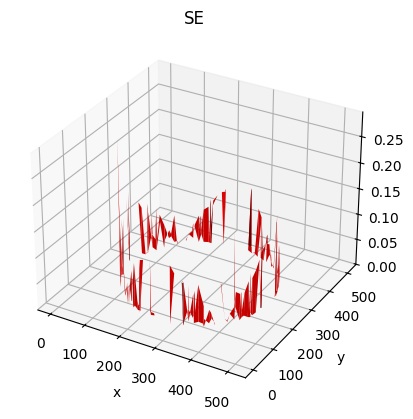

SE visualization of graysphere25 without the trick:
The max error value is: 0.2429039907368924


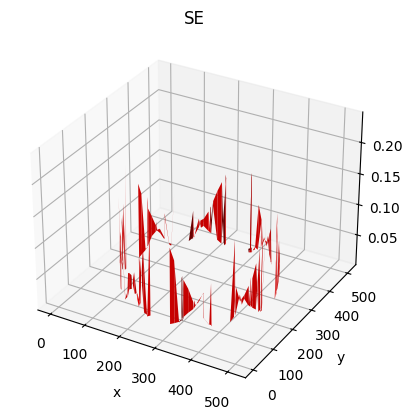

SE visualization of graysphere5 with the trick:
The max error value is: 1.1575454400510206


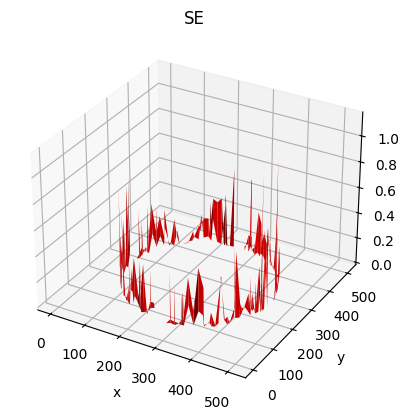

SE visualization of graysphere25 with the trick:
The max error value is: 0.8672454889034561


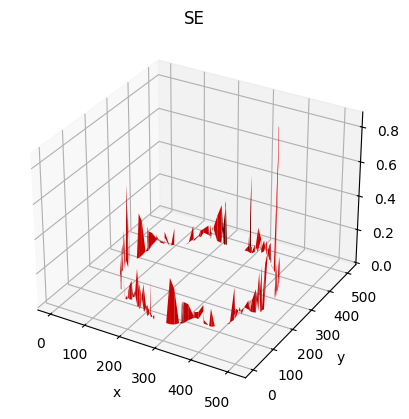

In [12]:
# Using part of a helper function to just visualize the SE:
def vis_SE(SE):
    stride = 1
    X, Y, _ = np.meshgrid(np.arange(0, np.shape(normals)[0], stride),
                          np.arange(0, np.shape(normals)[1], stride),
                          np.arange(1))
    X = X[..., 0]
    Y = Y[..., 0]

    fig = plt.figure()
    ax = fig.add_subplot(projection='3d')
    H_SE = SE[::stride, ::stride]
    ax.plot_surface(X, Y, H_SE.T, color='r')
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_title("SE")
    print(f"The max error value is: {np.max(SE[np.invert(np.isnan(SE))])}")
    plt.show()

p_s5, q_s5, SE_s5 = check_integrability(normals_s5)
p_s25, q_s25, SE_s25 = check_integrability(normals_s25)    

p_s5_trick, q_s5_trick, SE_s5_trick = check_integrability(normals_s5_trick)
p_s25_trick, q_s25_trick, SE_s25_trick = check_integrability(normals_s25_trick)

# Treshold all the SE's on 0.005:
treshold = 0.005
SE_s5[SE_s5 <= treshold] = np.nan
SE_s25[SE_s25 <= treshold] = np.nan
SE_s5_trick[SE_s5_trick <= treshold] = np.nan
SE_s25_trick[SE_s25_trick <= treshold] = np.nan

print("Figure 17: visualizations of the SE of the differenct estimations")
print("SE visualization of graysphere5 without the trick:")
vis_SE(SE_s5)
print("SE visualization of graysphere25 without the trick:")
vis_SE(SE_s25)
print("SE visualization of graysphere5 with the trick:")
vis_SE(SE_s5_trick)
print("SE visualization of graysphere25 with the trick:")
vis_SE(SE_s25_trick)



##### <font color='yellow'>Answer:</font>

- These errors could come from the fact that the method for solving the gradients can give errors. But As most errors are around the borders of the sphere its likely to come from the fact that the surface normals have a sharp transition around the borders because the surface normals of the background are 0's. This makes that the transition is not continuous and makes it not integrable. 

- when comparing the 5 image errors with the 25 image errors we see that whether or not we use the shadow trick, the 25 image maxerrors are lower than the 5 image maxerrors.

- when comparing the nonshadow trick with the shadow trick we observe that when the trick is applied the errors become greater regardless of the amount of images.

- When the shadow trick is applied it looks like the error almost goes around the whole border while without the image trick there are parts of the border without an error higher than 

<a id="question-22"></a>
#### <font color='#FF0000'>Question 22 (6 points)</font>

To reconstruct the surface height map, you need to integrate the partial derivatives over a path. Since we are working with discrete structures, this integration is done by summing their values.

The algorithm presented in the chapter suggests performing the integration in a column-major order: start at the top-left corner, integrate along the first column, and then proceed to the right along each row. However, it is also recommended to use multiple paths and average the results to help distribute the errors from derivative estimates.

In this question, you will:

1. Construct the surface height map using column-major order as described in the algorithm.
2. Implement the row-major path integration method.

Your implementation should be added to the `construct_surface()` function.

**Note**: By default, Numpy uses row-major operations. If you unroll an image to linearize the operation, you will end up with a row-major representation. Numpy can be configured to use column-major order, but this concern does not apply if you are using double for-loops without unrolling.

**Hint**: To further inspect the shape of the objects and normal directions, consider using the `matplotlib.pyplot.quiver` function. Be sure to choose appropriate sub-sampling ratios for proper illustration. Add this to the `show_results()` function if needed.

In [13]:
def construct_surface(p, q, path_type='column'):
    """
    Constructs the surface function represented as height_map.

    This function integrates the partial derivatives p and q to reconstruct the surface height map.
    The integration can be done along a column-major, row-major, or an averaged path.

    Args:
        p: The partial derivative of the surface function with respect to x (df/dx).
        q: The partial derivative of the surface function with respect to y (df/dy).
        path_type: The type of path to construct the height_map, either 'column', 'row', or 'average'.

    Returns:
        height_map: The reconstructed surface height map.
    """

    h, w = p.shape
    height_map = np.zeros([h, w])

    if path_type == 'column':
        for i in range(1,h):
            height_map[i,0] = height_map[i-1,0] + q[i,0]
        
        for y in range(1,w):
            height_map[:,y] = height_map[:,y-1] + p[:,y]
            
    elif path_type == 'row':
        for i in range(1,w):
            height_map[0,i] = height_map[0,i-1] + p[0,i]
        
        for x in range(1,h):
            height_map[x,:] = height_map[x-1,:] + q[x,:]

    elif path_type == 'average':
        col_major_height_map = construct_surface(p, q, path_type='column')
        row_major_height_map = construct_surface(p, q, path_type='row')
        height_map = 1/2 * (col_major_height_map + row_major_height_map)


    return height_map

Figure 18: Showing the surface reconstruction results for 5 light sources using column-major integration:


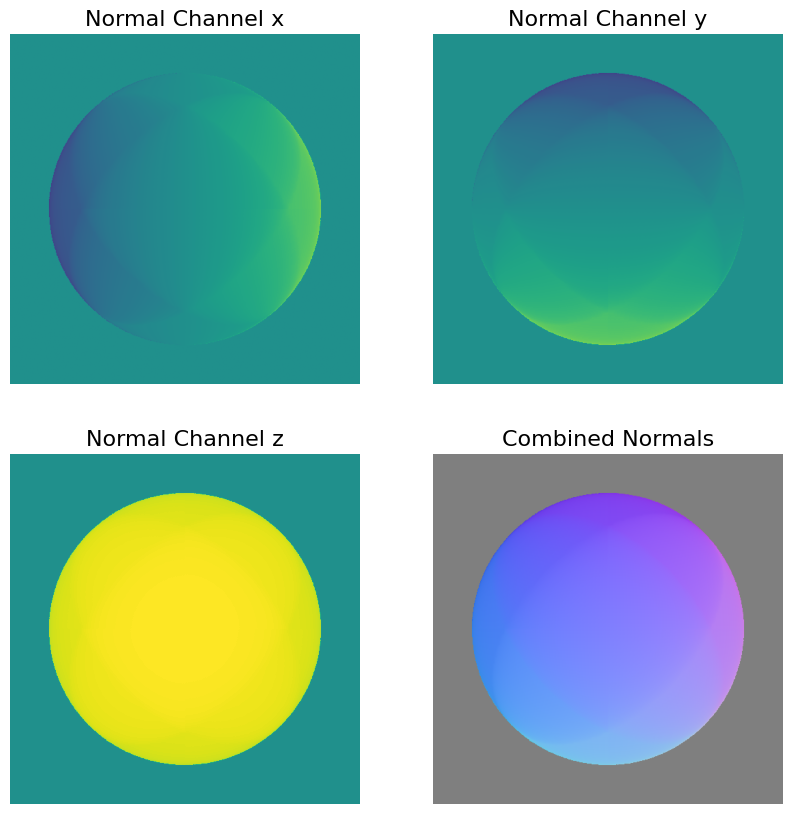

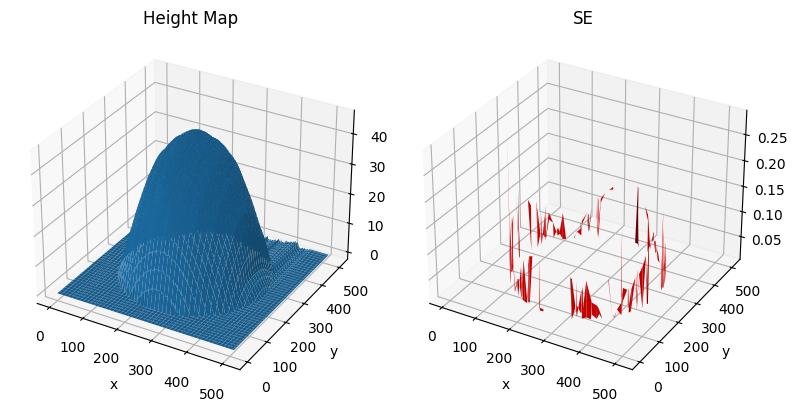

In [14]:
p, q, SE = check_integrability(normals_s5)

height_map = construct_surface(p, q, "column")

# set the threshold for visualization
threshold = 0.01
SE[SE <= threshold] = float('nan')

print('Figure 18: Showing the surface reconstruction results for 5 light sources using column-major integration:')
show_results(None, normals_s5, height_map, SE)

<a id="question-23"></a>
#### <font color='#FF0000'>Question 23 (2 points)</font>

Compare the results obtained from the two different integration paths (column-major and row-major). 

What are the differences in the reconstructed surface height maps when using these two paths? Discuss any observations you notice between the two approaches.

Figure 19: Showing the surface reconstruction results for 5 light sources using row-major integration:


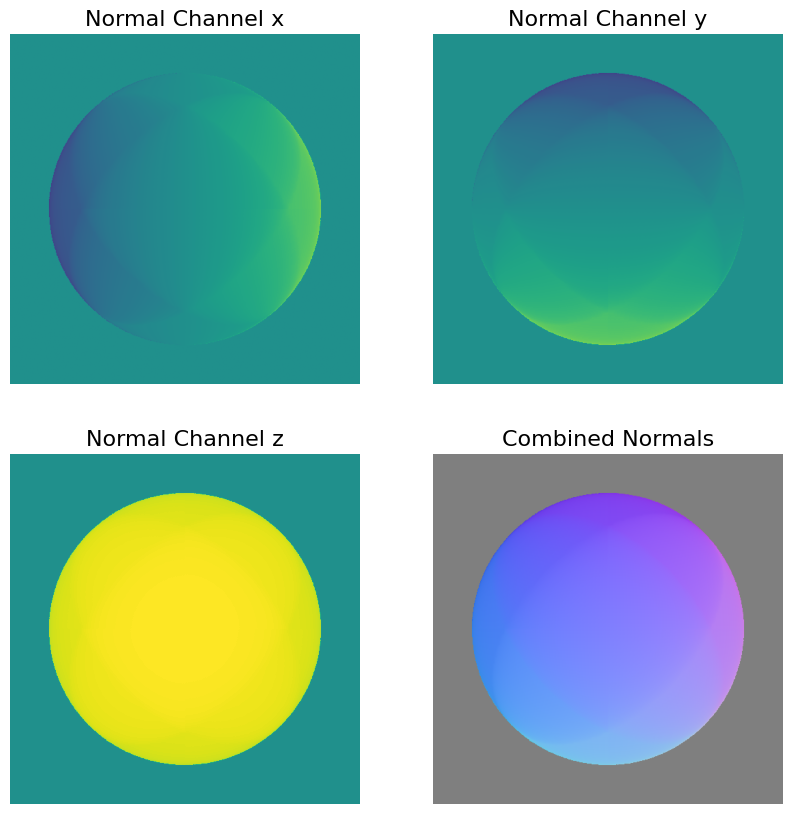

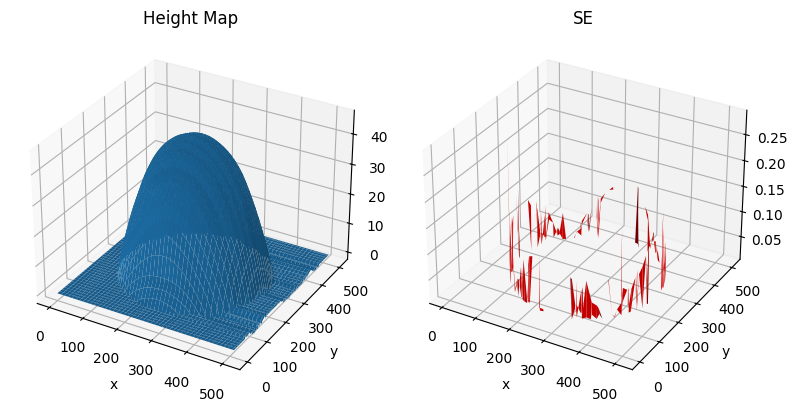

In [15]:
p, q, SE = check_integrability(normals_s5)

height_map = construct_surface(p, q, "row")

# set the threshold for visualization
threshold = 0.01
SE[SE <= threshold] = float('nan')

print('Figure 19: Showing the surface reconstruction results for 5 light sources using row-major integration:')
show_results(None, normals_s5, height_map, SE)

##### <font color='yellow'>Answer:</font>

The first difference we observe is that the background in the column-major reconstruction (Figure 18) has bumps at the back along the x axis, while the row major (Figure 19) has bumps on the right side along the y axis. On a closer look we also see that there are contour lines in the direction of the y axis in Figure 18 while the contour lines in Figure 19 are in the direction of the x axis. This is not suprising as these are the directions the second part of the integration takes. So the integrations in Figure 18 are only dependend on the preceding height in the y axis and not the x axis any more. For Figure 19 this is visa versa.

<a id="question-24"></a>
#### <font color='#FF0000'>Question 24 (3 points)</font>

Now, take the average of the results obtained from the column-major and row-major integration paths.

Do you observe any improvement compared to using only one path? Additionally, analyze whether the construction results vary when using different numbers of images in the reconstruction process. (So compare the results obtained from the GraySphere5 and GraySphere25 datasets.)

Figure 20: Showing the surface reconstruction results for 5 light sources using average integration:


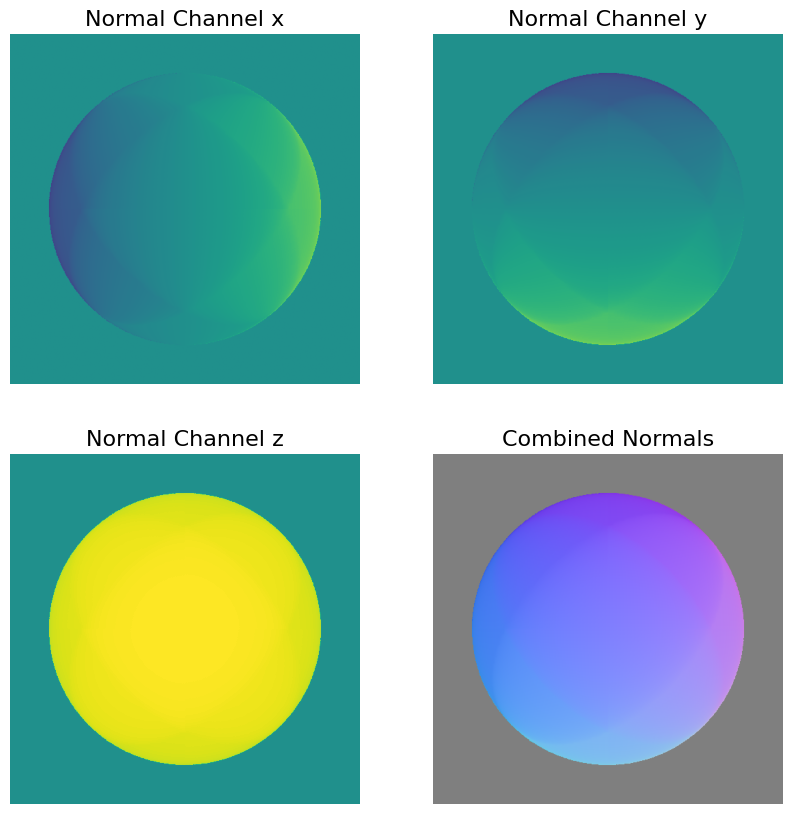

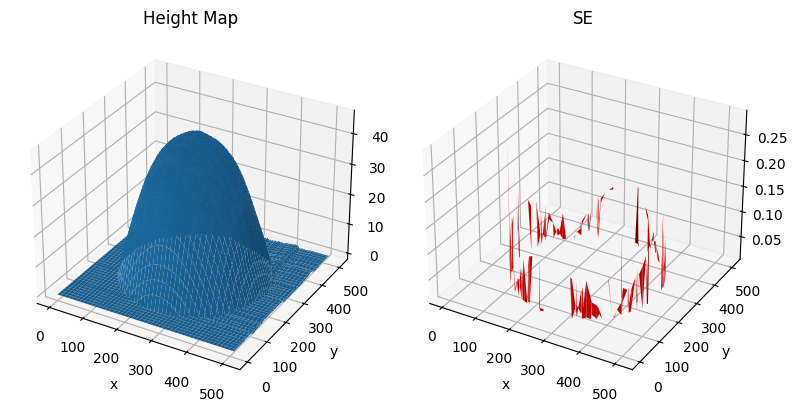

Figure 21: height map reconstruction for 25 images column integration


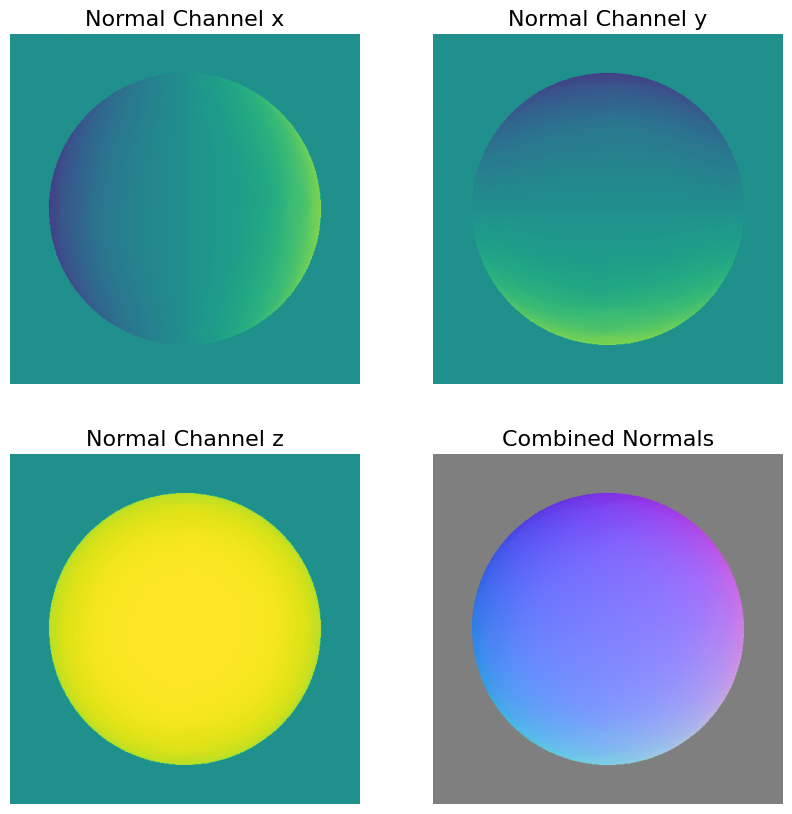

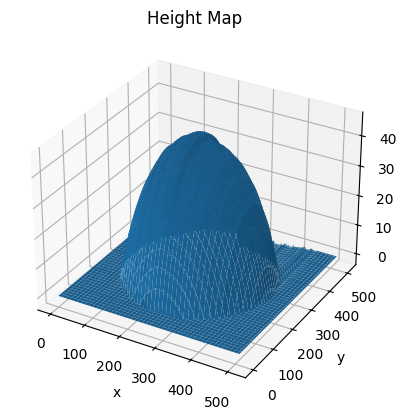

Figure 22: height map reconstruction for 25 lights row integration


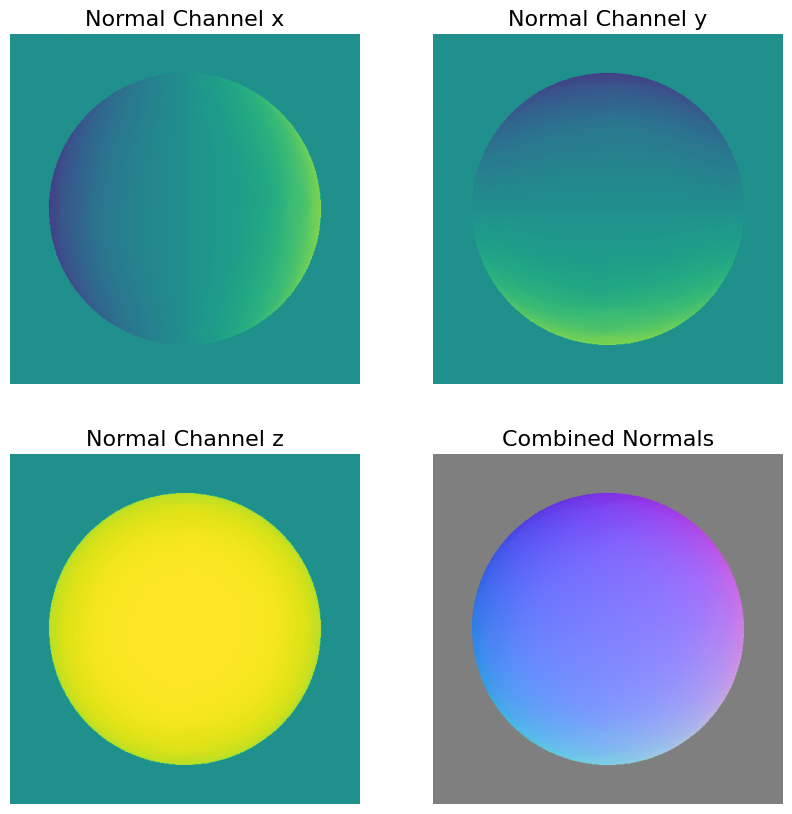

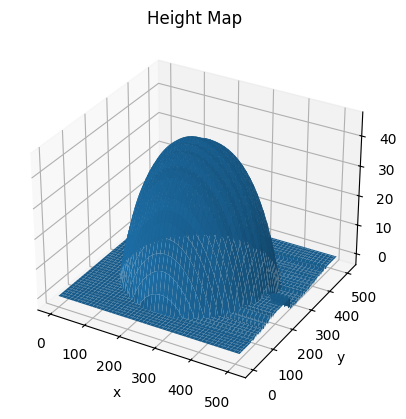

Figure 23: height map reconstruction for 25 lights average integration


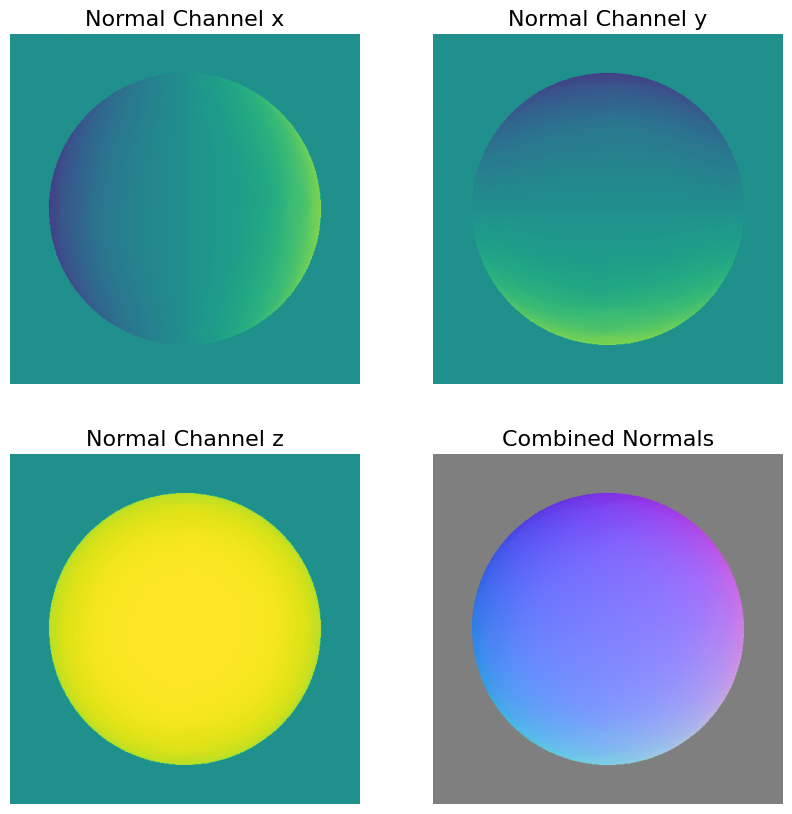

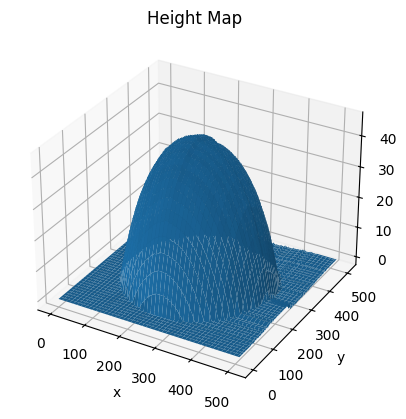

In [16]:
p, q, SE = check_integrability(normals_s5)

height_map = construct_surface(p, q, "average")

# set the threshold for visualization
threshold = 0.01
SE[SE <= threshold] = float('nan')

print('Figure 20: Showing the surface reconstruction results for 5 light sources using average integration:')
show_results(None, normals_s5, height_map, SE)

height_map = construct_surface(p_s25, q_s25, "column")
print('Figure 21: height map reconstruction for 25 images column integration')
show_results(None, normals_s25, height_map)
height_map = construct_surface(p_s25, q_s25, "row")
print('Figure 22: height map reconstruction for 25 lights row integration')
show_results(None, normals_s25, height_map)
height_map = construct_surface(p_s25, q_s25, "average")
print('Figure 23: height map reconstruction for 25 lights average integration')
show_results(None, normals_s25, height_map)

##### <font color='yellow'>Answer:</font>

- We do see improvements of the heightmap in Figure 20, instead of seeing horizontal or vertical contourlines we observed with the single path integrations we see that these have been smooth out by the averaging. Its also visible that the bumps at background has been smoothed out.

- When comparing the reconstructions of 5 images with those of 25 images we observe only a little difference in the surface for the row-major (Figure 22) integration. There is a larger bump on the right side of the edge of the image along the y axis then with the 5 image one. This bump gets smoother in the average one but still remains visible. Overall the integrated surface of the estimation with 5 images looks a bit smoother.

<a id="question-25"></a>
#### <font color='#FF0000'>Question 25 (3 points)</font>

Run the photometric stereo algorithm on the MonkeyGray model using the `photometric_stereo` function and display the results. Complete the provided code, execute the algorithm, and show the outcomes.

In [19]:
def photometric_stereo(image_dir='./photometrics_images/MonkeyGray/'):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for a given set of images under varying illumination conditions.

    Args:
        image_dir: Directory containing the input images (default is './images/photometrics_images/MonkeyGray/').

    Returns:
        None
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_synthetic_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface gradient from the stack of images and light source matrix
    print('Computing surface albedo and normal map...\n')

    albedo, normals = estimate_albedo_and_normals(image_stack, scriptV)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')

    p, q, SE = check_integrability(normals)

    threshold = 0.01

    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height
    print('Computing surface height map...\n')

    height_map = construct_surface(p, q, "column")

    # show results
    print('Displaying results...\n')
    print("\nFigure 24: Albedo and surface normals for MonkeyGray")
    show_results(albedo, normals, height_map, SE)

If you estimate the albedo and surface normal for MonkeyGray, the cell below will run for at least 20 seconds.

Loading images...

image size (h*w): 512*512


Finish loading 121 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 3248

Computing surface height map...

Displaying results...


Figure 24: Albedo and surface normals for MonkeyGray
Albedo shape: (512, 512)


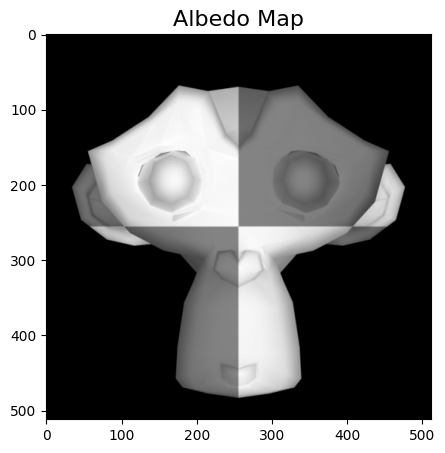

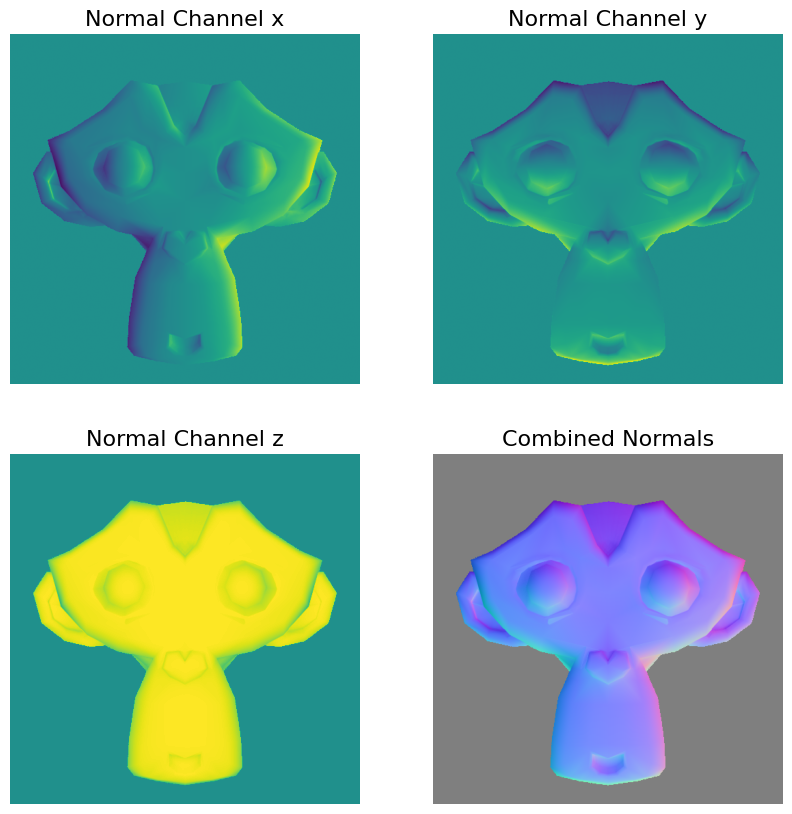

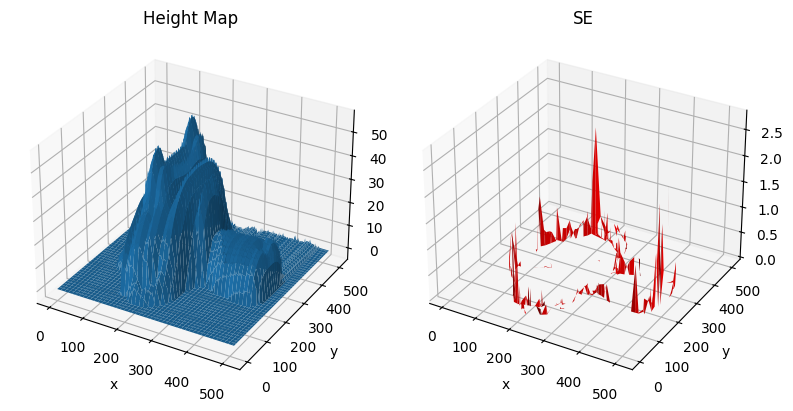

In [20]:
# Use the function
image_dir = './photometrics_images/MonkeyGray/'
photometric_stereo(image_dir)

<a id="question-26"></a>
#### <font color='#FF0000'>Question 26 (2 points)</font>

The albedo results for the MonkeyGray model may exhibit more errors compared to the sphere. Observe and describe the errors that arise when running the photometric stereo algorithm on the MonkeyGray model.

What could be the reasons for these errors? Experiment with different numbers of images, as you did in Question 15 and Question 18, to see the effects and discuss your observations.

##### <font color='yellow'>Answer:</font>

When running the photometric stereo algorithm on the MonkeyGray images, many surface errors occur around the edges of the surface in the reconstruction of the surface's depth. Although both the SphereGray and MonkeyGray images have many surface errors around the edges, it is evident from the surface error maps for both datasets that the errors for the MonkeyGray images (which are as high as 2.5) are much larger than the errors for the SphereGray images (which are at most 0.25).

This difference is likely cause by the differences in shape of the sphere versus monkey surfaces: while the edges of the surface in the SphereGray images have regularly-shaped edges due to their spherical shape, the monkey surfaces are a more irregular shape.

<a id="question-27"></a>
#### <font color='#FF0000'>Question 27 (2 points)</font>

Considering the errors observed in the albedo results for the MonkeyGray model, what do you think could help in reducing or solving these errors? Provide your thoughts on potential strategies or methods that might improve the accuracy of the results.

##### <font color='yellow'>Answer:</font>

>*Write your answer here.*

<a id="question-28"></a>
#### <font color='#FF0000'>Question 28 (5 points)</font>

So far, we have assumed that albedos and input images are 1-channel grayscale images. To work with 3-channel RGB images, a simple approach is to split the input image into separate channels and treat them individually. However, this method may introduce issues when constructing the surface normal map if a pixel value in a channel is zero.

Update the implementation to work with 3-channel RGB inputs. Complete the functions `load_synthetic_images_rgb` and `estimate_albedo_and_normals_rgb ` to handle RGB images, and test your updated implementation with the SphereColor and MonkeyColor models using the `photometric_stereo_rgb` function. Make sure to display the results.

In [32]:
def load_synthetic_images_rgb(image_dir):
    """
    Loads synthetic RGB images and light directions.

    This function reads images from the specified directory, processes each color channel separately, 
    and stacks them together along with their corresponding light directions.

    Args:
        image_dir: Path to the directory containing the images.

    Returns:
        A tuple containing the image stack and the light directions.
    """

    red, red_scriptV = load_synthetic_images(image_dir, 0)
    green, green_scriptV = load_synthetic_images(image_dir, 1)
    blue, blue_scriptV = load_synthetic_images(image_dir, 2)

    image_stack_rgb = np.stack([red, green, blue])
    scriptV_rgb = np.stack([red_scriptV, green_scriptV, blue_scriptV])


    return image_stack_rgb, scriptV_rgb

In [33]:
def estimate_albedo_and_normals_rgb(image_stack, scriptV, shadow_trick=True):
    """
    Estimates albedo and normals from a stack of RGB images and light directions.

    This function processes each color channel separately to estimate the albedo and normal maps.
    The results from each channel are then combined to produce the final albedo and normal maps.

    Args:
        image_stack: Image stacks for each color channel.
        scriptV: Light directions for each color channel.
        shadow_trick: Whether or not to use the shadow trick. Defaults to True.

    Returns:
        A tuple containing the albedo and normal maps.
    """

    red_alb, red_norm = estimate_albedo_and_normals(image_stack[0], scriptV[0], shadow_trick)   
    green_alb, green_norm = estimate_albedo_and_normals(image_stack[1], scriptV[1], shadow_trick) 
    blue_alb, blue_norm = estimate_albedo_and_normals(image_stack[2], scriptV[2], shadow_trick) 

    # combine albedos from all channels
    albedo_rgb = np.stack([red_alb, green_alb, blue_alb], axis=-1)

    # combine normals from all channels
    normals = np.divide((red_norm + green_norm + blue_norm), np.linalg.norm((red_norm + green_norm + blue_norm), axis=2, keepdims=True), where=np.linalg.norm((red_norm + green_norm + blue_norm), axis=2, keepdims=True)!=0)

    return albedo_rgb, normals

In [34]:
def photometric_stereo_rgb(image_dir='./photometrics_images/SphereColor/'):
    """
    Performs photometric stereo on RGB images to estimate the surface albedo, normals, and height map.

    This function loads RGB images from the specified directory, computes the surface albedo and 
    normal maps, checks integrability, reconstructs the surface height map, and displays the results.

    Args:
        image_dir: Path to the directory containing the images.
    """

     # load images
    print('Loading images...\n')
    [image_stack_rgb, scriptVs_rgb] = load_synthetic_images_rgb(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute surface albedos and normal maps
    print('Computing surface albedo and normal map...\n')
    albedos_rgb, normals = estimate_albedo_and_normals_rgb(image_stack_rgb, scriptVs_rgb)

    # check integrability: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')

    p, q, SE = check_integrability(normals)    

    threshold = 0.01

    # get number of outliers
    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    # reconstruct surface height map
    print('Computing surface height map...\n')

    height_map_rgb = construct_surface(p, q, "column")


    # show results
    print('Displaying results...\n')

    show_results(albedos_rgb, normals, height_map_rgb, SE)


If you estimate the albedo and surface normal for SphereColor and MonkeyColor, the cell below will run for atleast 1 or 2 minutes.

Figure 26: RGB Photometric Stereo on SphereColor images
Loading images...

image size (h*w): 512*512
image size (h*w): 512*512
image size (h*w): 512*512
Finish loading 512 images.

Computing surface albedo and normal map...



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.3330540801140764].


Integrability checking

Number of outliers: 1559

Computing surface height map...

Displaying results...

Albedo shape: (512, 512, 3)


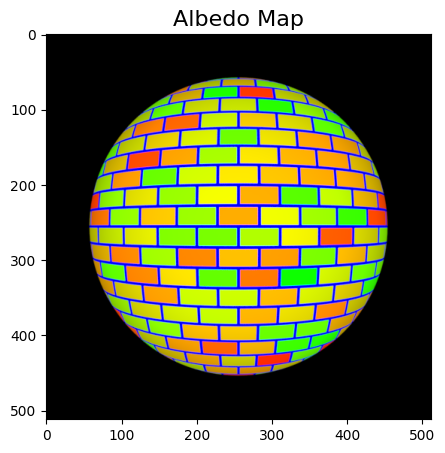

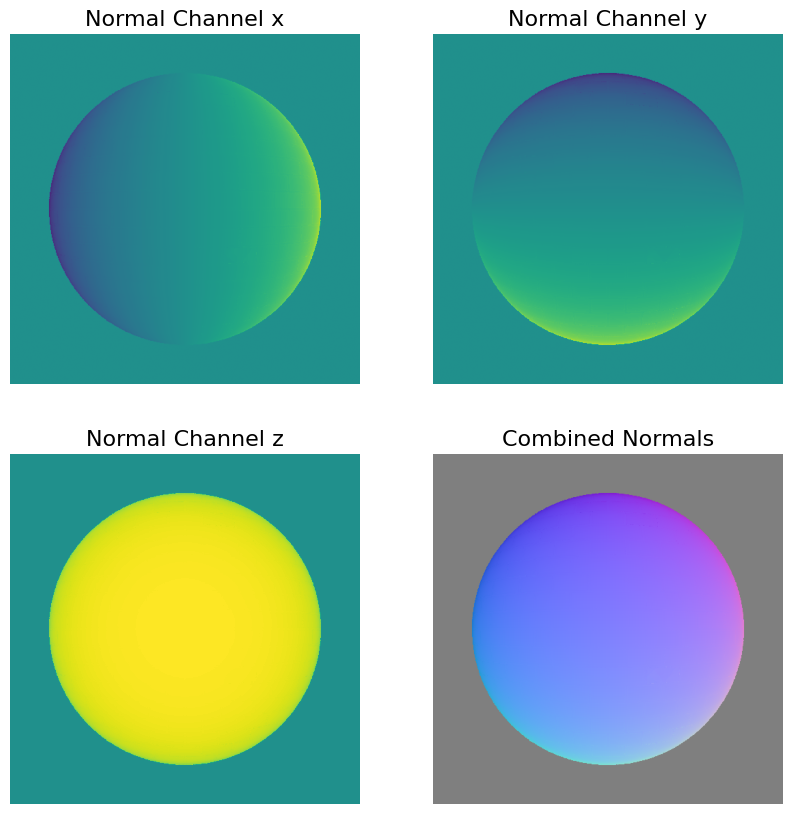

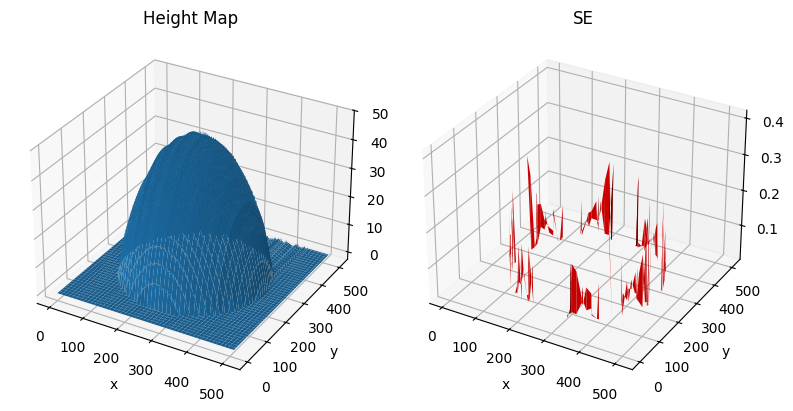

Figure 26: RGB Photometric Stereo on MonkeyColor images
Loading images...

image size (h*w): 512*512
image size (h*w): 512*512
image size (h*w): 512*512
Finish loading 512 images.

Computing surface albedo and normal map...



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.3706152735561639].


Integrability checking

Number of outliers: 3259

Computing surface height map...

Displaying results...

Albedo shape: (512, 512, 3)


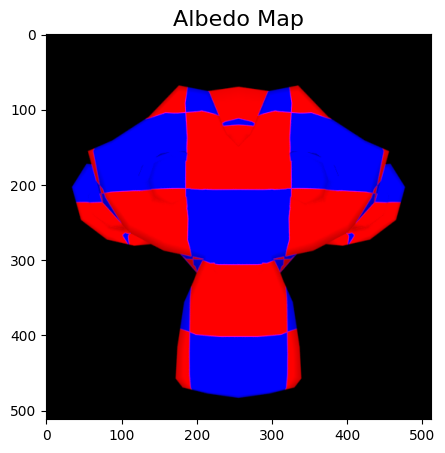

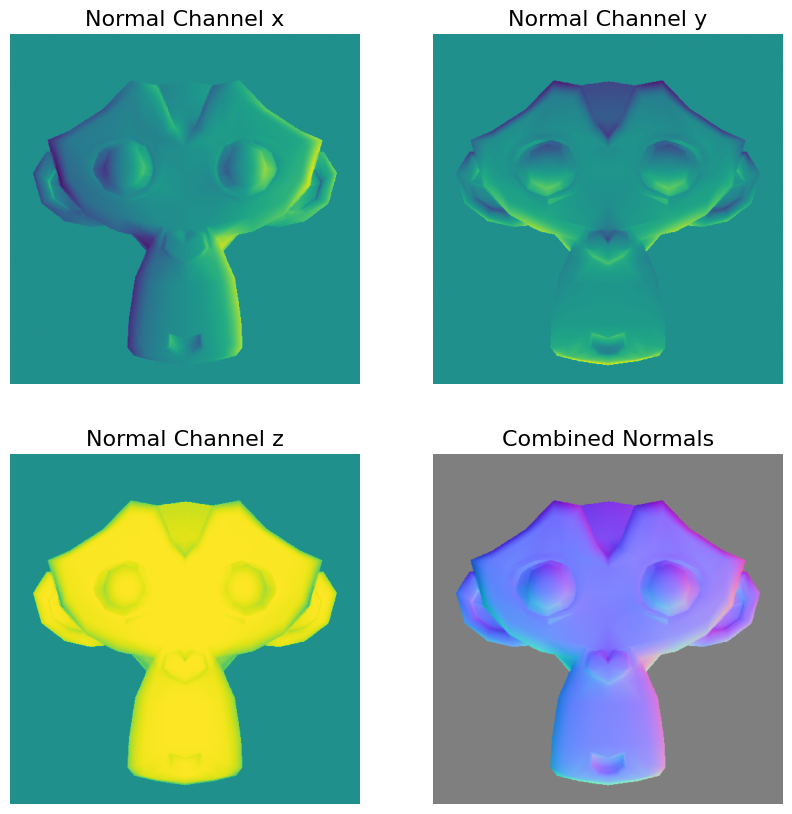

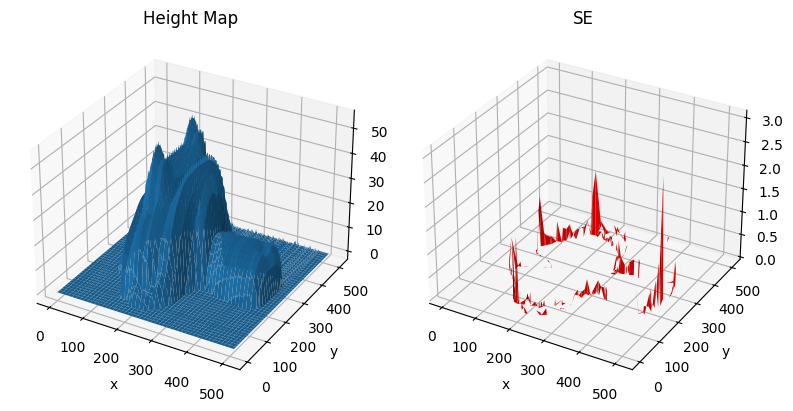

In [35]:
# SphereColor
print("Figure 26: RGB Photometric Stereo on SphereColor images")
image_dir = './photometrics_images/SphereColor/'
photometric_stereo_rgb(image_dir)

# MonkeyColor
print("Figure 26: RGB Photometric Stereo on MonkeyColor images")
image_dir = './photometrics_images/MonkeyColor/'
photometric_stereo_rgb(image_dir)

<a id="question-29"></a>
#### <font color='#FF0000'>Question 29 (2 points)</font>

Explain the changes made to the function and discuss the results of these changes.

##### <font color='yellow'>Answer:</font>

In order to make it applicable to color images, the photometric stereo function was updated to:
- load images separately for each of the three color channels (red, green, blue), with the resulting image stack containing images for all three channels
- estimate albedos for each color channel separately and then combine all albedos for all three channels by stacking them together
- estimate normals for each color channel separately and then combine normals for all three channels by adding them together then normalizing the resulting vector in order to make it a unit vector

These changes resulted in larger surface errors when reconstructing the depth of the surfaces, evidenced by not only large maximum errors in the SE maps for both SphereColor and MonkeyColor but also in the increase in error outliers (ie. number of times that the surface error exceeded the set threshold of 0.01. For MonkeyGray, the number of outliers was 3248 compared to 3259 for MonkeyColor images.

<a id="question-30"></a>
#### <font color='#FF0000'>Question 30 (2 points)</font>

Observe the problem in the constructed surface normal map and height map. Explain why a zero pixel could be a problem and propose a way to overcome that.

##### <font color='yellow'>Answer:</font>

- Because the intensity values of each point in an image (given by the pixel value) are used to estimate surface normals, a zero pixel can result in large errors in the computtaion of the surface normal vector for that point on the surface, which would in turn lead to an incorrect reconstruction of the surface's shape at that pixel.
- Isssues resulting from a zero pixel could be overcome by taking the average of the surrounding pixels and assigning the resulting value to the zero pixel.

<a id="question-31"></a>
#### <font color='#FF0000'>Question 31 (4 points)</font>

Now, it's time to apply the algorithm to real-world datasets. We will first use the Yale Face Database.

For the Face dataset, you should:
- Load the images
- Compute the surface albedo and normal map
- Run the integrability check
- Find the number of outliers
- Compute the surface height
- Show the results

Run the algorithm for the Yale Face images: [Yale Face Database](http://cvc.cs.yale.edu/cvc/projects/yalefaces/yalefaces.html). The Yale face data is included in the lab material. The `load_face_images` function is provided as a helper. You should complete the `photometric_stereo_face_dataset` function as part of this task.

Make sure to display the results for the Face dataset using the 3 paths (column-major, row-major, and average) when constructing the surface height map.

**Hint**: For proper computation of albedo and surface normal, you may want to suspend the shadow trick described in the text, and use the original formula:
$$i = Vg(x,y)$$

In [36]:
def load_face_images(image_dir='./photometrics_images/yaleB02/'):
    """
    Loads a set of face images from the Yale Face Database and computes corresponding light directions.

    Args:
        image_dir: The directory containing the Yale Face images. Defaults to './photometrics_images/yaleB02/'.

    Returns:
        A tuple containing:
            - image_stack: A stack of images with the ambient image subtracted and normalized.
            - scriptV: An array of light direction vectors corresponding to each image.
    """
    
    # define the number of images to load
    num_images = 64
    
    # load the ambient image (the image without any lighting)
    filename = os.path.join(image_dir, 'yaleB02_P00_Ambient.pgm')
    ambient_image = cv2.imread(filename, -1)
    
    # get the height and width of the ambient image
    h, w = ambient_image.shape

    # import glob to find all image files in the directory
    import glob
    
    # get a list of all image files that match the pattern for the yaleB02 face dataset
    d = glob.glob(os.path.join(image_dir, 'yaleB02_P00A*.pgm'))
    
    # randomly select a subset of images to match the num_images count
    import random
    d = random.sample(d, num_images)
    
    # extract the base filenames from the list of image paths
    filenames = [os.path.basename(x) for x in d]

    # initialize arrays for storing angles and image data
    ang = np.zeros([2, num_images])
    image_stack = np.zeros([h, w, num_images])

    # loop through each selected image file
    for j in range(num_images):
        # extract the lighting angles from the filename
        ang[0,j], ang[1,j] = np.double(filenames[j][12:16]), np.double(filenames[j][17:20])
        
        # load the image and subtract the ambient image to get the actual illumination effect
        image_stack[...,j] = cv2.imread(os.path.join(image_dir, filenames[j]), -1) - ambient_image

    # calculate the light direction vectors based on the extracted angles
    x = np.cos(np.pi*ang[1,:]/180) * np.cos(np.pi*ang[0,:]/180)
    y = np.cos(np.pi*ang[1,:]/180) * np.sin(np.pi*ang[0,:]/180)
    z = np.sin(np.pi*ang[1,:]/180)
    
    # combine the direction vectors, adjusting for normal direction
    scriptV = [-1,-1,1] * np.array([y,z,x]).transpose(1,0)  ##eggonz COMMENT: fix (-1,-1,1) normal directiona

    # convert the image stack to double precision
    image_stack = np.double(image_stack)
    
    # set any negative pixel values to 0 (removing underflow)
    image_stack[image_stack<0] = 0
    
    # find the minimum and maximum pixel values in the image stack
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    
    # normalize the image stack to have values between 0 and 1, or set to zeros if min and max are equal
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)  # avoid failure when all pixel values are the same

    # return the processed image stack and light directions
    return image_stack, scriptV

In [39]:
def photometric_stereo_face_dataset(image_dir='./photometrics_images/yaleB02/', path_type='average'):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for the Yale Face Dataset under varying illumination conditions.

    Args:
        image_dir: Directory containing the input images (default is './images/photometrics_images/yaleB02/').
        path_type: Type of path integration to use for surface height computation (default is 'average').

    Returns:
        None
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_face_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute surface albedos and normal maps 
    # without shadow trick
    albedos_face, normals_face = estimate_albedo_and_normals(image_stack, scriptV, False)

    # check integrability: is (dp / dy  -  dq / dx) ^ 2 small everywhere?

    p, q, SE = check_integrability(normals_face)    

    threshold = 0.01

    # get number of outliers
    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height map
    height_map_face = construct_surface(p, q, path_type)

    # show results
    show_results(albedos_face, normals_face, height_map_face, SE)

If you estimate the albedo and surface normal using the three path types, the cell below will run for at least 10 seconds.


Figure 28: Face dataset with column-major integration path
Loading images...

Finish loading 64 images.

Number of outliers: 572

Albedo shape: (192, 168)


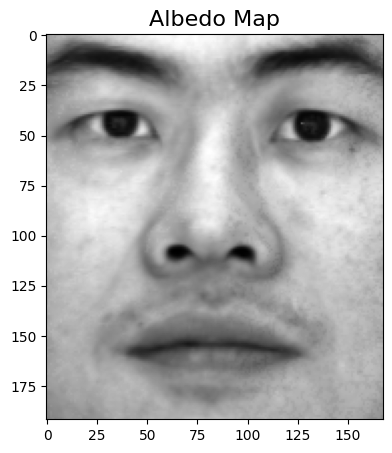

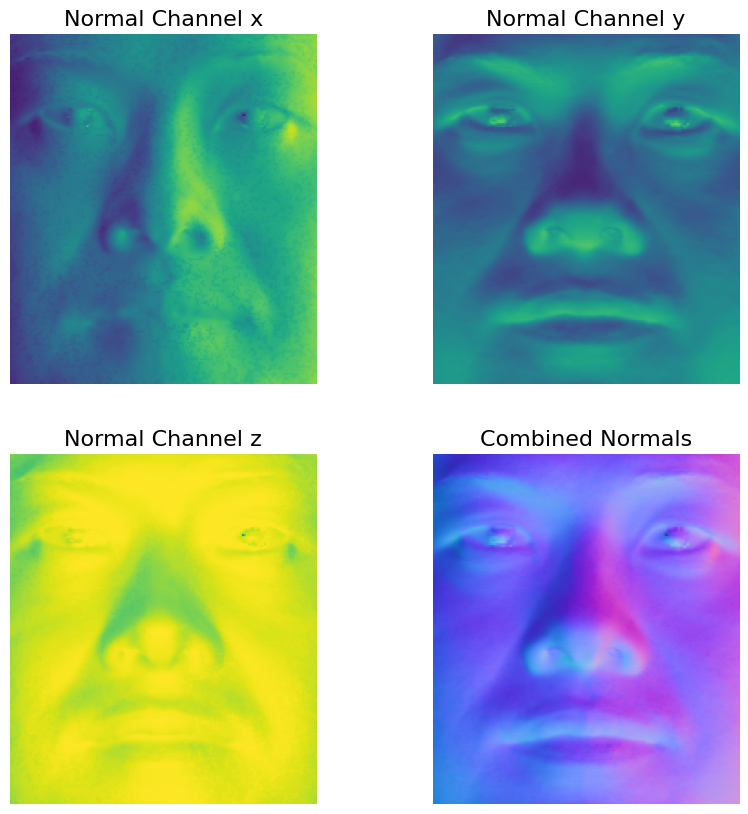

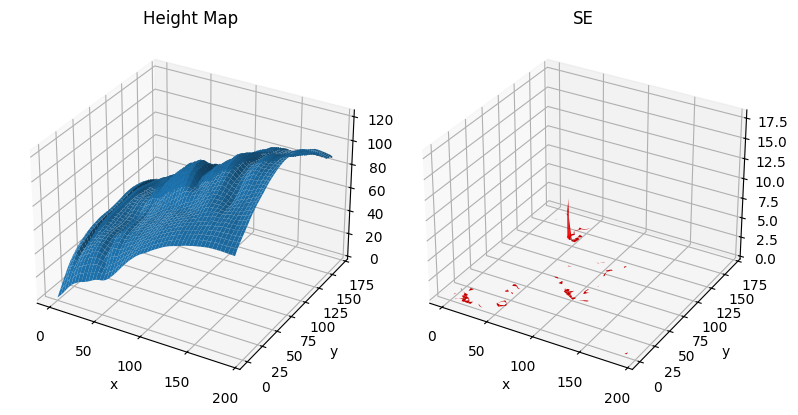


Figure 29: Face dataset with row-major integration path
Loading images...

Finish loading 64 images.

Number of outliers: 572

Albedo shape: (192, 168)


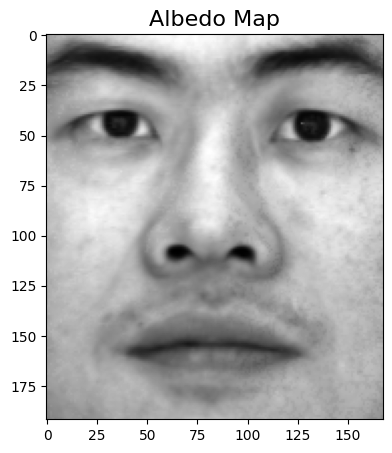

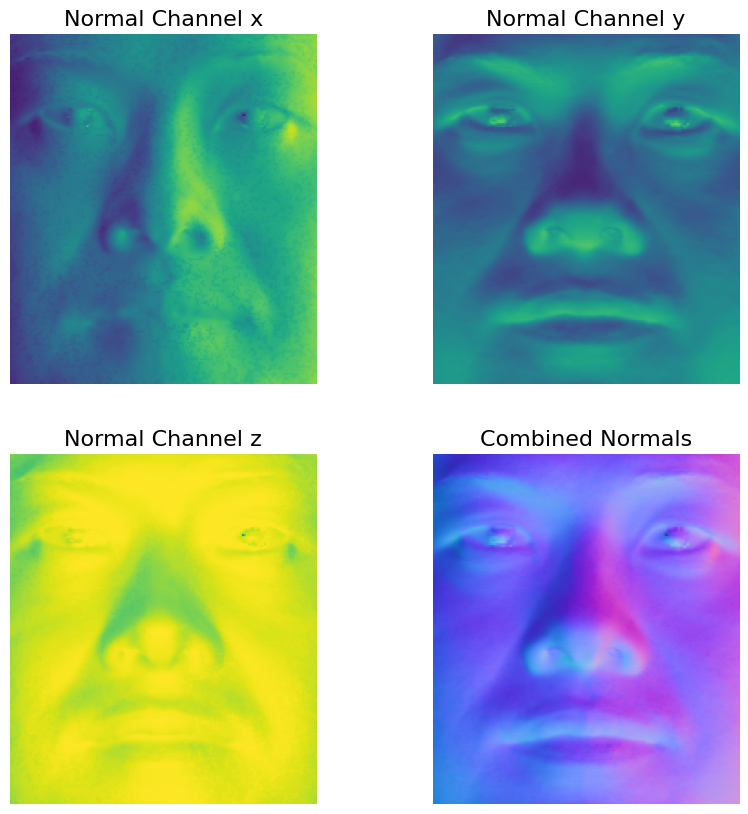

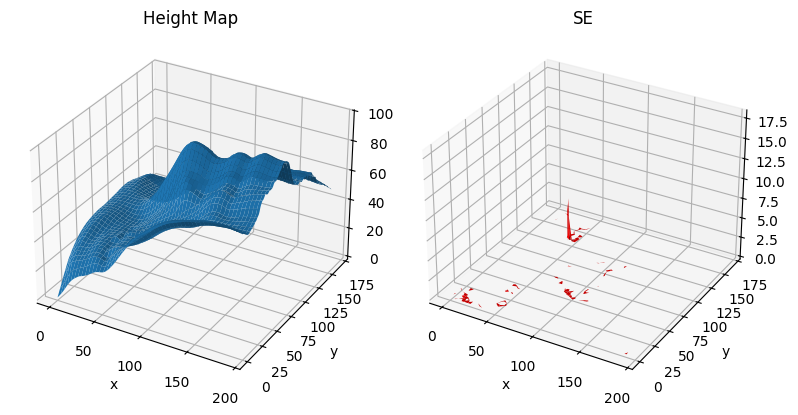


Figure 30: Face dataset with average integration path
Loading images...

Finish loading 64 images.

Number of outliers: 572

Albedo shape: (192, 168)


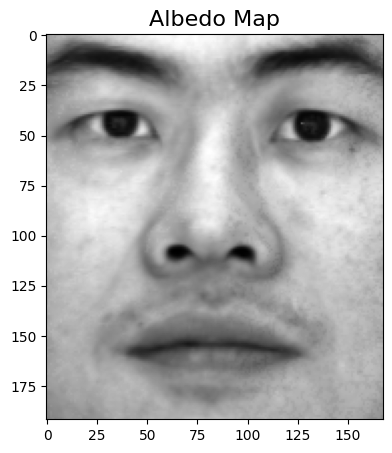

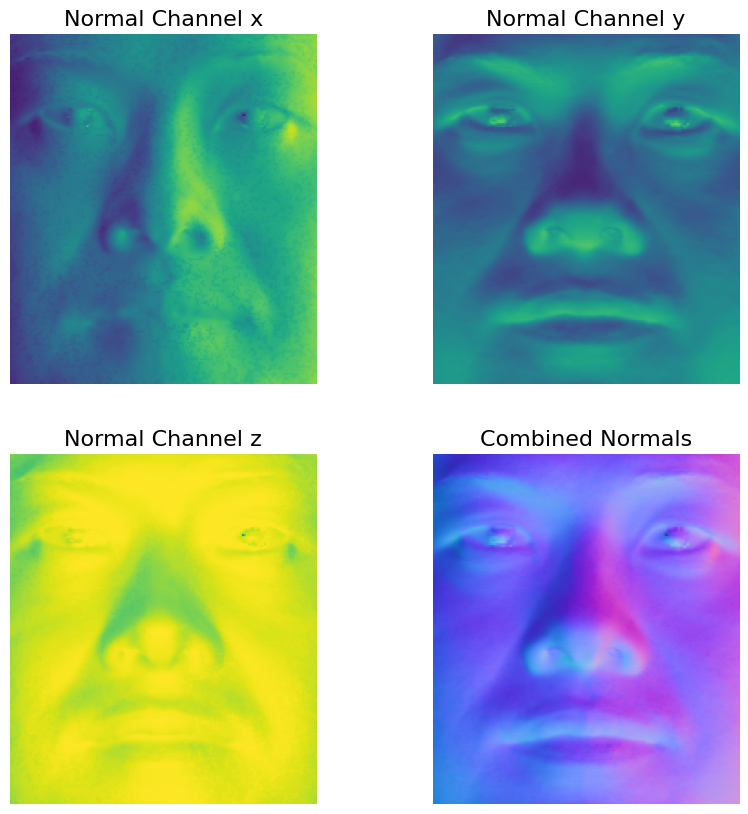

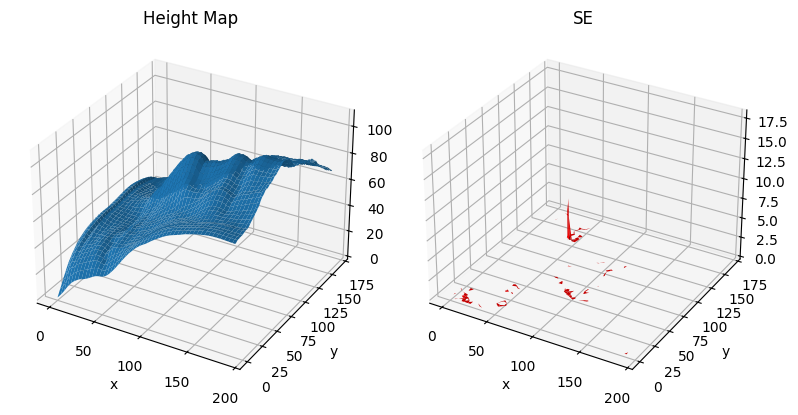

In [40]:
# run on face dataset w/ different integration paths
faces_image_dir='./photometrics_images/yaleB02/'

# column-major
print("\nFigure 28: Face dataset with column-major integration path")
photometric_stereo_face_dataset(faces_image_dir, path_type='column')

# row-major
print("\nFigure 29: Face dataset with row-major integration path")
photometric_stereo_face_dataset(faces_image_dir, path_type='row')

# column-major
print("\nFigure 30: Face dataset with average integration path")

photometric_stereo_face_dataset(faces_image_dir, path_type='average')

<a id="question-32"></a>
#### <font color='#FF0000'>Question 32 (1 point)</font>

Observe and discuss the results for different integration paths in the `photometric_stereo_face_dataset` function.

##### <font color='yellow'>Answer:</font>

- From the height maps, the height of the surface (face) as a whole is estimated to be higher with a column-major path than with a row-major path. However, individual features of the face, such as nose, are reconstructed with a greater depth when using a row-major path compared to a column-major path.
- Taking the average of the column-major and row-major integration paths, the depth of the surface as a whole as well as that of its individual features falls somewhere in between those of the row-major and column major paths.

<a id="question-33"></a>
#### <font color='#FF0000'>Question 33 (2 points)</font>

Discuss how the images violate the assumptions of the shape-from-shading methods. Include specific input images to illustrate your points.

##### <font color='yellow'>Answer:</font>

Methods aimed at inferring shape from shading assume that the surface depicted in an image is of a uniform albedo/reflectance. However, some of the images in the Faces dataset violate this assumption by not having uniform albedo. A few examples are shown below:


Figure 31: Example face images with non-uniform albedo
Total Image count: 2


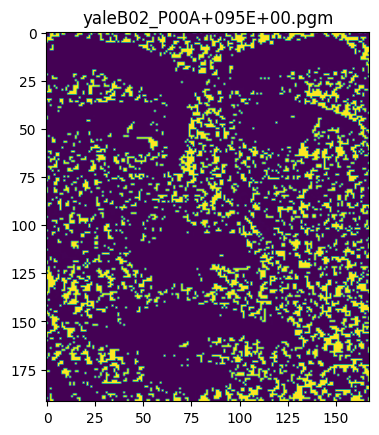

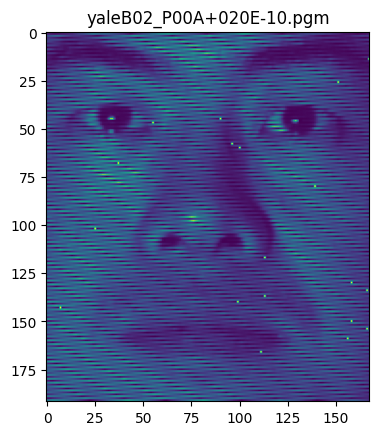

In [44]:
print("\nFigure 31: Example face images with non-uniform albedo")

# helper func to load individual face images from list of filenames

def load_imgs_from_filenames(filenames): # specify specific image to load

    image_dir='./photometrics_images/yaleB02/'
    
    # load the ambient image (the image without any lighting)
    filename = os.path.join(image_dir, 'yaleB02_P00_Ambient.pgm')
    ambient_image = cv2.imread(filename, -1)

    print('Total Image count:', len(filenames))

    for name in filenames:

        # load the image and subtract the ambient image to get the actual illumination effect
        image = cv2.imread(os.path.join(image_dir, name), -1) - ambient_image

        # convert the image stack to double precision
        image_db = np.double(image)

        # print('image name:', name)
        plt.imshow(image_db)
        plt.title(name)
        plt.show()


example_problem_images = ['yaleB02_P00A+095E+00.pgm','yaleB02_P00A+020E-10.pgm'] 

# display image examples
load_imgs_from_filenames(example_problem_images)

<a id="question-34"></a>
#### <font color='#FF0000'>Question 34 (2 points)</font>

How would the results improve when the problematic images are removed? Try it out and show the results in your notebook.

To complete this task, you should implement the `load_face_images_filtered` and `photometric_stereo_face_filtered` functions.

In [45]:
def load_face_images_filtered(image_dir='./photometrics_images/yaleB02/', bad_images=[]):
    """
    Loads a set of face images from the Yale Face Database, excluding problematic ones, and computes corresponding light directions.

    Args:
        image_dir: The directory containing the Yale Face images. Defaults to './photometrics_images/yaleB02/'.
        bad_images: A list of filenames to exclude from the image stack.

    Returns:
        A tuple containing:
            - image_stack: A stack of images with the ambient image subtracted, normalized, and problematic images removed.
            - scriptV: An array of light direction vectors corresponding to each image.
    """

    # YOUR CODE HERE
    # load the ambient image (the image without any lighting)
    filename = os.path.join(image_dir, 'yaleB02_P00_Ambient.pgm')
    ambient_image = cv2.imread(filename, -1)
    
    # get the height and width of the ambient image
    h, w = ambient_image.shape

    # import glob to find all image files in the directory
    import glob
    
    # get a list of all image files that match the pattern for the yaleB02 face dataset
    d = glob.glob(os.path.join(image_dir, 'yaleB02_P00A*.pgm'))
    
    # extract the base filenames from the list of image paths
    # filter out problematic images
    filenames = [os.path.basename(x) for x in d]

    filenames = [i for i in filenames if i not in bad_images]

    # number of images to load after filtering
    num_images = len(filenames)

    # print(f'Number of images after filtering: {num_images}')

    # initialize arrays for storing angles and image data
    ang = np.zeros([2, num_images])
    image_stack = np.zeros([h, w, num_images])

    # loop through each selected image file
    for j in range(num_images):
        # extract the lighting angles from the filename
        ang[0,j], ang[1,j] = np.double(filenames[j][12:16]), np.double(filenames[j][17:20])
        
        # load the image and subtract the ambient image to get the actual illumination effect
        image_stack[...,j] = cv2.imread(os.path.join(image_dir, filenames[j]), -1) - ambient_image

    # calculate the light direction vectors based on the extracted angles
    x = np.cos(np.pi*ang[1,:]/180) * np.cos(np.pi*ang[0,:]/180)
    y = np.cos(np.pi*ang[1,:]/180) * np.sin(np.pi*ang[0,:]/180)
    z = np.sin(np.pi*ang[1,:]/180)
    
    # combine the direction vectors, adjusting for normal direction
    scriptV = [-1,-1,1] * np.array([y,z,x]).transpose(1,0)  ##eggonz COMMENT: fix (-1,-1,1) normal directiona

    # convert the image stack to double precision
    image_stack = np.double(image_stack)
    
    # set any negative pixel values to 0 (removing underflow)
    image_stack[image_stack<0] = 0
    
    # find the minimum and maximum pixel values in the image stack
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    
    # normalize the image stack to have values between 0 and 1, or set to zeros if min and max are equal
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)  # avoid failure when all pixel values are the same

    # return the processed image stack and light directions

    return image_stack, scriptV

In [46]:
def photometric_stereo_face_filtered(bad_images=[], image_dir='./photometrics_images/yaleB02/', shadow_trick=False, path_type='average'):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for the Yale Face Dataset, excluding problematic images.

    Args:
        bad_images: A list of filenames to exclude from the image stack (default is an empty list).
        image_dir: Directory containing the input images (default is './photometrics_images/yaleB02/').
        shadow_trick: Whether or not to use the shadow trick for albedo and normal estimation (default is False).
        path_type: Type of path integration to use for surface height computation (default is 'average').

    Returns:
        None
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_face_images_filtered(image_dir, bad_images)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute surface albedos and normal maps 
    # without shadow trick
    albedos_face, normals_face = estimate_albedo_and_normals(image_stack, scriptV, shadow_trick)

    # check integrability: is (dp / dy  -  dq / dx) ^ 2 small everywhere?

    p, q, SE = check_integrability(normals_face)    

    # print('max se',SE.max())

    threshold = 0.01

    # get number of outliers
    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height map

    height_map_face = construct_surface(p, q, path_type)

    # show results

    show_results(albedos_face, normals_face, height_map_face, SE)


Figure 32: Photometric Stereo on filtered faces
Loading images...

Finish loading 57 images.

Number of outliers: 388

Albedo shape: (192, 168)


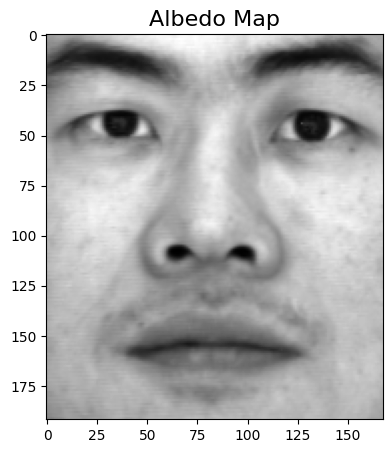

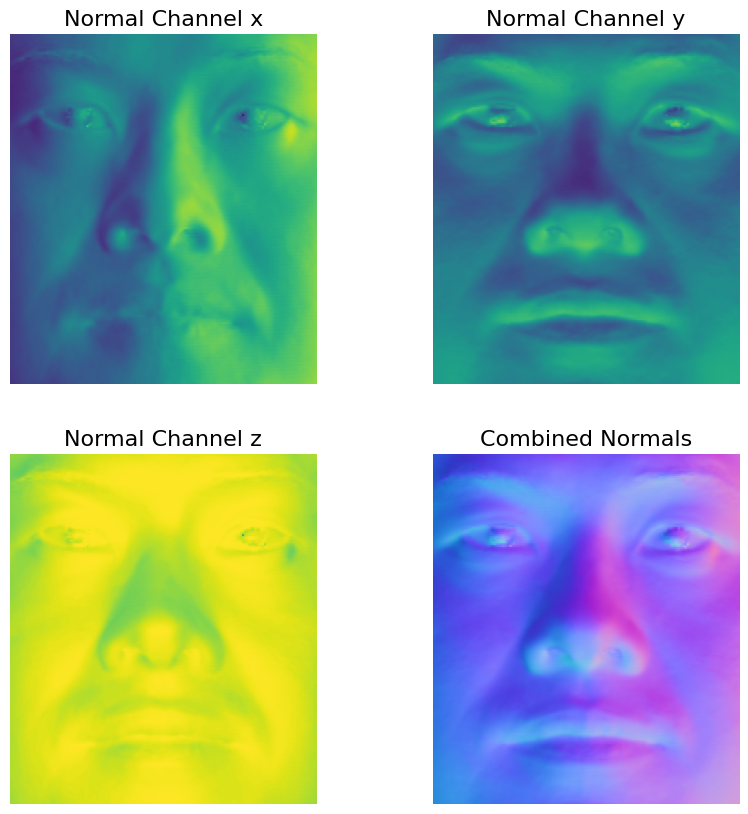

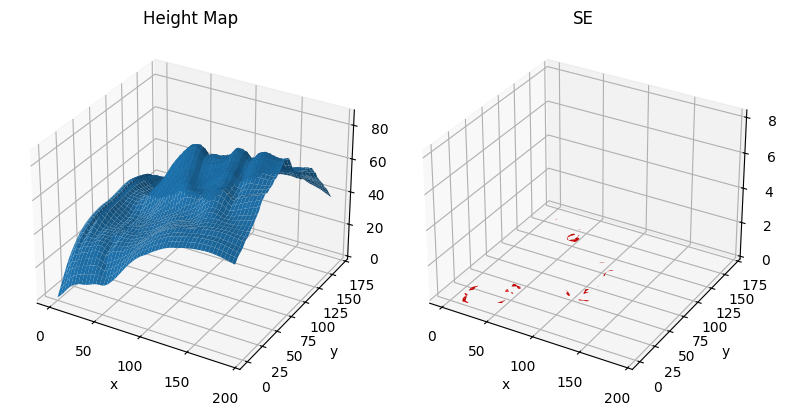

In [50]:
# list of images to filter out


bad_images = ['yaleB02_P00A+095E+00.pgm','yaleB02_P00A+020E-10.pgm', 'yaleB02_P00A-130E+20.pgm', 'yaleB02_P00A+120E+00.pgm',
                'yaleB02_P00A+130E+20.pgm', 'yaleB02_P00A+110E+65.pgm', 'yaleB02_P00A-110E+15.pgm'] 


faces_dir = './photometrics_images/yaleB02/'

print("\nFigure 32: Photometric Stereo on filtered faces")


photometric_stereo_face_filtered(bad_images, faces_dir, shadow_trick=False, path_type='average')

<a id="question-35"></a>
#### <font color='#FF0000'>Question 35 (1 point)</font>

Discuss the results obtained after removing the problematic images. What are the differences in the results, and how do they compare to the original results?

##### <font color='yellow'>Answer:</font>

After removing the problematic images, there is less noise in the reconstructed surface has a lower overall depth (as evidenced by the height map when using 'average' integration paths). Also, the surface errors are smaller when the problematic images are removed, as is evident in the SE maps.

<a id="question-36"></a>
#### <font color='#FF0000'>Question 36 (4 points)</font>

Now, it's time to apply the algorithm to the Apple dataset using real-world 3-channel RGB inputs.

For the Apple dataset, you should:
- Load the images
- Compute the surface albedo and normal map
- Run the integrability check
- Find the number of outliers
- Compute the surface height
- Show the results

Use the images in the "Apple" folder. The `load_apple_images` function is provided as a helper. You should complete the `photometric_stereo_apple_dataset` function as part of this task.

Observe and discuss the results for different integration paths. You may encounter difficulties using this non-synthetic dataset—try if filtering may help.

Make sure to display the results using the 3 paths (column-major, row-major, and average) when constructing the surface height map.

In [57]:
def load_apple_images(image_dir='./photometrics_images/Apple', channel=2):
    """
    Loads a set of apple images from the Apple dataset and computes corresponding light directions.

    Args:
        image_dir: The directory containing the Apple images. Defaults to './photometrics_images/Apple/'.

    Returns:
        A tuple containing:
            - image_stack: A stack of images with only the red channel extracted and normalized.
            - scriptV: An array of light direction vectors corresponding to each image.
    """

    # define the number of images to load
    num_images = 99
    
    # load a sample image to determine its dimensions
    filename = os.path.join(image_dir, 'I_0000.png')
    try_image = cv2.imread(filename, -1)
    
    # get the height and width of the sample image
    h, w = try_image[:,:,0].shape

    # import glob to find all image files in the directory
    import glob
    
    # get a list of all image files that match the pattern for the Apple dataset
    d = glob.glob(os.path.join(image_dir, 'I_00*.png'))
    
    # randomly select a subset of images to match the num_images count
    import random
    d = random.sample(d, num_images)
    
    # extract the base filenames from the list of image paths and their corresponding indices
    filenames = [os.path.basename(x) for x in d]
    filenames_idx = [int(i.split('_')[1].split('.')[0]) for i in filenames]

    # initialize arrays for storing angles and image data
    ang = np.zeros([2, num_images])
    image_stack = np.zeros([h, w, num_images])

    # loop through each selected image file
    for j in range(num_images):
        # load the image and extract the red channel (index 2)
        image_stack[...,j] = cv2.imread(os.path.join(image_dir, filenames[j]), -1)[:,:,channel]

    # read light direction vectors from the provided file
    with open('./photometrics_images/Apple/light_directions_refined.txt') as file:
        lines = [line.split() for line in file]
        x, y, z = [], [], []
        
        # extract light directions corresponding to the selected images
        for idx in filenames_idx:
            x.append(float(lines[idx][0]))
            y.append(float(lines[idx][1]))
            z.append(float(lines[idx][2]))

    # combine the direction vectors, adjusting for normal direction
    scriptV = [1,-1,1] * np.array([x,y,z]).transpose(1,0)  ##eggonz COMMENT: fix (1,-1,1) normal directiona

    # convert the image stack to double precision
    image_stack = np.double(image_stack)
    
    # set any negative pixel values to 0 (removing underflow)
    image_stack[image_stack < 0] = 0
    
    # find the minimum and maximum pixel values in the image stack
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    
    # normalize the image stack to have values between 0 and 1, or set to zeros if min and max are equal
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)  # avoid failure when all pixel values are the same

    # return the processed image stack and light directions
    return image_stack, scriptV

In [60]:
def photometric_stereo_apple_dataset(image_dir='./photometrics_images/Apple/', path_type='average'):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for the Apple Dataset under varying illumination conditions.

    Args:
        image_dir: Directory containing the input images (default is './photometrics_images/Apple/').
        path_type: Type of path integration to use for surface height computation (default is 'average').

    Returns:
        None
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [images_red, scriptV_red] = load_apple_images(image_dir, 2) # red channel
    [h, w, n] = images_red.shape

    [images_green, scriptV_green] = load_apple_images(image_dir, 1) # green channel

    [images_blue, scriptV_blue] = load_apple_images(image_dir, 0) # blue channel

    # stack images/directions for all three channels
    image_stack = np.stack([images_red, images_green, images_blue])
    scriptV = np.stack([scriptV_red, scriptV_green, scriptV_blue])

    print('Finish loading %d images.\n' % n)

    # compute surface albedos and normal maps
    print('Computing surface albedo and normal map...\n')
    albedos_rgb, normals = estimate_albedo_and_normals_rgb(image_stack, scriptV, False)

    # check integrability: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')

    p, q, SE = check_integrability(normals)    

    threshold = 0.01

    # get number of outliers
    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    # reconstruct surface height map
    print('Computing surface height map...\n')

    height_map_rgb = construct_surface(p, q, path_type)


    # show results
    print('Displaying results...\n')

    show_results(albedos_rgb, normals, height_map_rgb, SE)

If you estimate the albedo and surface normal using the three path types, the cell below will run for at least 1 minute.


Figure 33: Apple dataset with column-major integration path
Loading images...

Finish loading 99 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 11811

Computing surface height map...

Displaying results...

Albedo shape: (696, 646, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0006566738406879022..1.072421018764841].


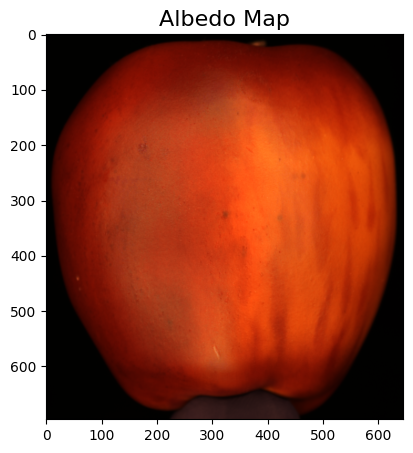

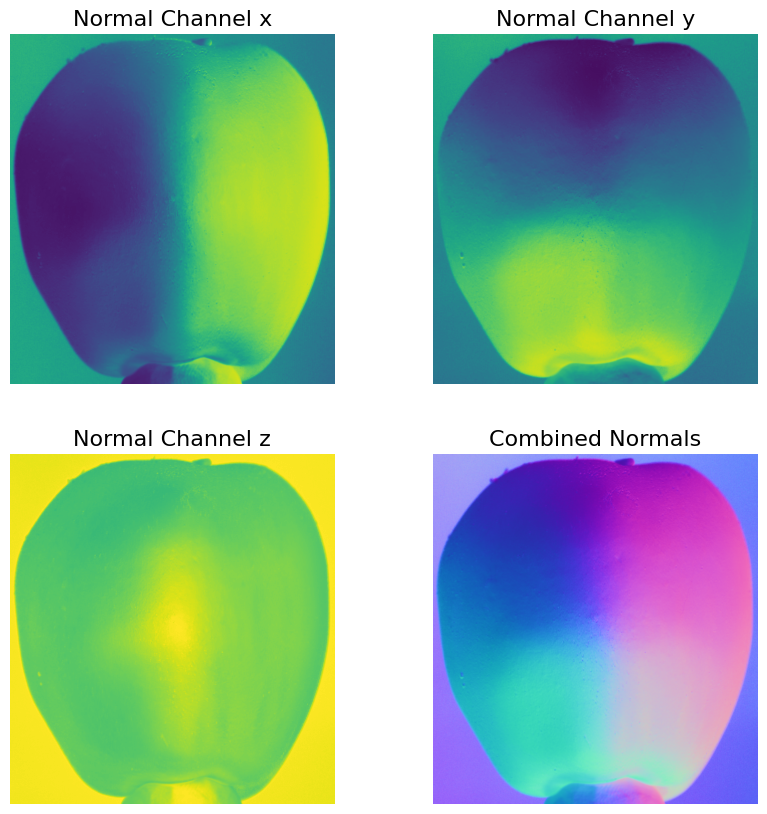

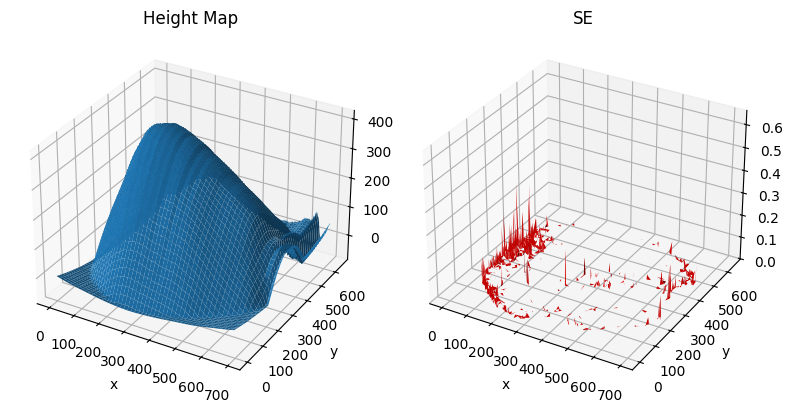


Figure 34: Apple dataset with row-major integration path
Loading images...

Finish loading 99 images.

Computing surface albedo and normal map...



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0006566738406879026..1.0724210187648413].


Integrability checking

Number of outliers: 11811

Computing surface height map...

Displaying results...

Albedo shape: (696, 646, 3)


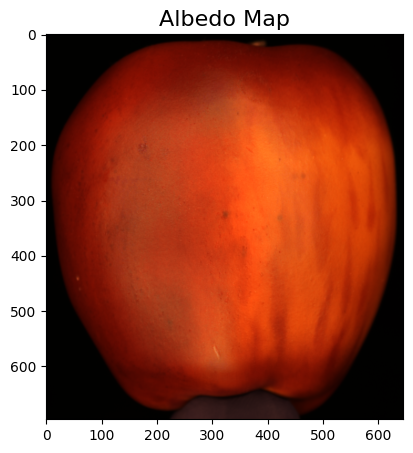

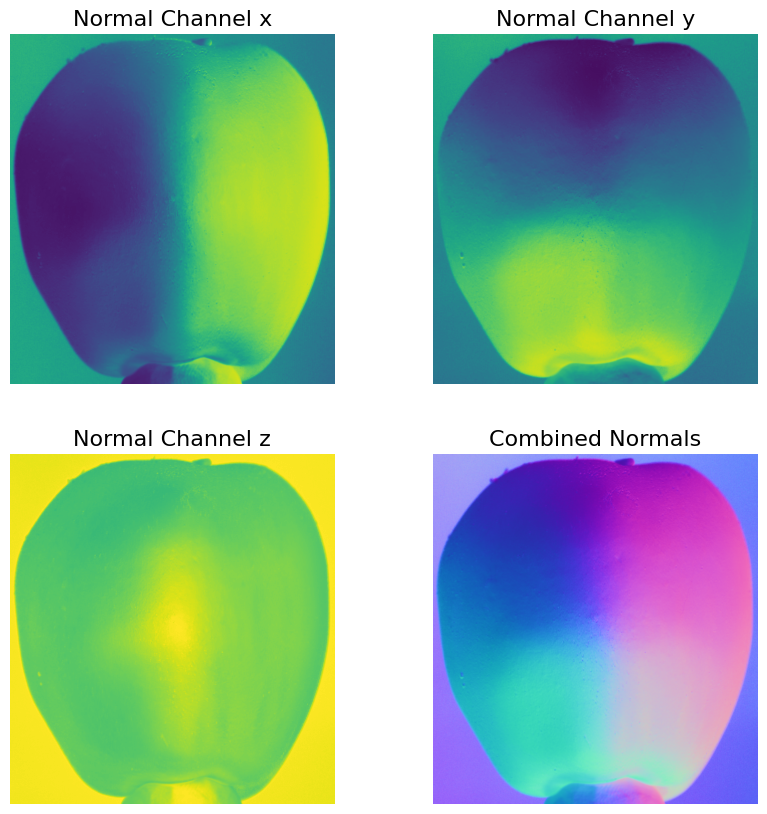

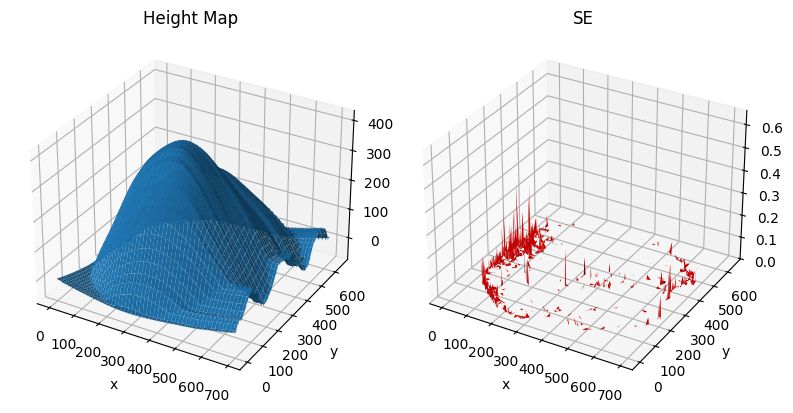


Figure 35: Apple dataset with average integration path
Loading images...

Finish loading 99 images.

Computing surface albedo and normal map...



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0006566738406879026..1.0724210187648409].


Integrability checking

Number of outliers: 11811

Computing surface height map...

Displaying results...

Albedo shape: (696, 646, 3)


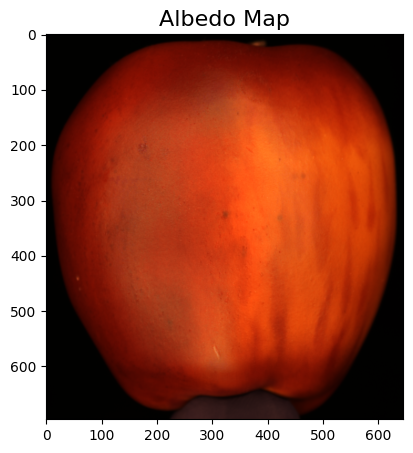

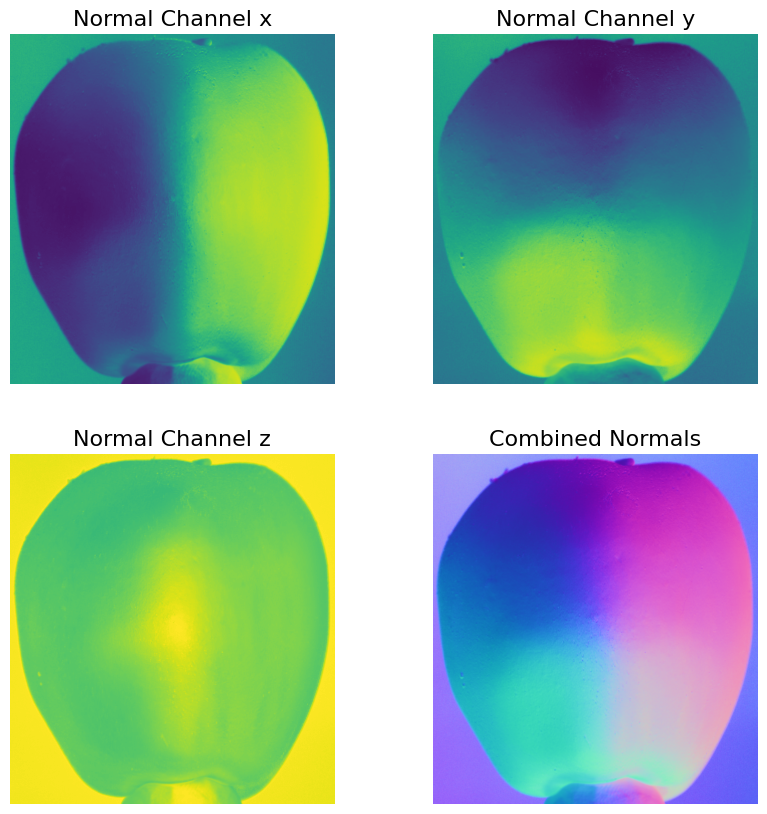

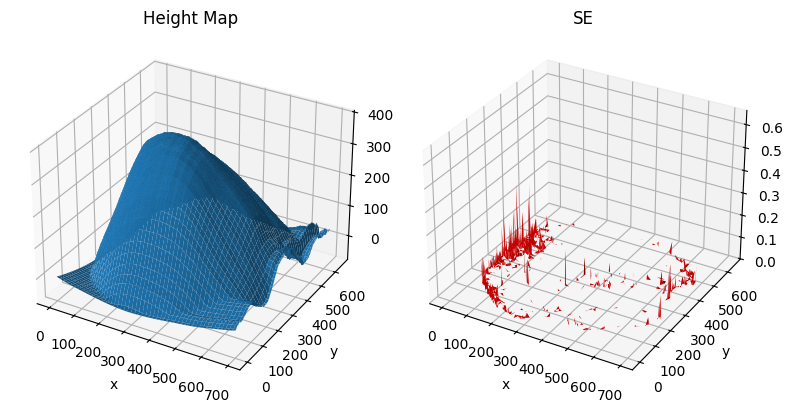

In [61]:
# run on apples dataset w/ different integration paths
apples_dir='./photometrics_images/Apple/'

# column-major
print("\nFigure 33: Apple dataset with column-major integration path")
photometric_stereo_apple_dataset(apples_dir, path_type='column')

# row-major
print("\nFigure 34: Apple dataset with row-major integration path")
photometric_stereo_apple_dataset(apples_dir, path_type='row')

# average
print("\nFigure 35: Apple dataset with average integration path")
photometric_stereo_apple_dataset(apples_dir, path_type='average')


<a id="question-37"></a>
#### <font color='#FF0000'>Question 37 (1 point)</font>

Observe and discuss the results for different integration paths in the `photometric_stereo_apple_dataset` function.

##### <font color='yellow'>Answer:</font>

- From the height maps, the reconstructed shape of the apple is more even/regular with the column-major integartion path than with the row-major path, which shows more irregularity (ridges) in the surface of the apple.
- Taking the average of the column-major and row-major integration paths, the height of the apple's surface is nearer to that of the row-major path than that of the column-major path, whose height map shows the apple as having greater depth.

<a id="section-x"></a>
### **Section X: Individual Contribution Report *(Mandatory)***

Because we want each student to contribute fairly to the submitted work, we ask you to fill out the textcells below. Write down your contribution to each of the assignment components in percentages. Naturally, percentages for one particular component should add up to 100% (e.g. 30% - 30% - 40%). No further explanation has to be given.

| Name | Contribution on Research | Contribution on Programming | Contribution on Writing |
| -------- | ------- | ------- | ------- |
| Jesse | 40 % | 30% % | 30% % |
| Ruben | 30 % | 40 % | 30 % |
| Chileshe | 30 % | 30 % | 40 % |

### - End of Notebook -